# bugga_bear *p* parameter set dither


In [1]:
import warnings
warnings.filterwarnings('ignore')

import time
whole_page_start_time = time.time()

import os
import sys
import inspect
import tempfile

import skimage.io as im_io

from PIL import TiffImagePlugin as tip
from PIL.TiffImagePlugin import Image

import matplotlib.pyplot as pyplot

sys.path.insert(0, '../src/')
sys.path.insert(0, 'scalygraphic/src/')

from im_scale_products import *
from impute_color import *

def get_test_domain_dict(it_max=None, scale_dist=None):
    """ Usage: 
    domain_dict = get_center_domain_dict(it_max, scale_dist)
    """
    if it_max is None:
        it_max = 64
        
    if scale_dist is None:
        scale_dist = 12
        
    domain_dict = get_default_domain_dict()
    domain_dict['it_max'] = it_max
    domain_dict['max_d'] = scale_dist / domain_dict['zoom']
    domain_dict['n_rows'] = 255
    domain_dict['n_cols'] = 255
    
    return domain_dict

def get_results_gray_set(list_tuple, domain_dict):
    """ Usage: new_im = get_results_gray_set(list_tuple, domain_dict)
    
    """
    ET, Z, Z0 = eq_iter.get_primitives(list_tuple, domain_dict)
    Zd_n2, Zr_n2, ETn_n2 = etg_norm(Z0, Z, ET)

    g_im_et = primitive_2_gray(ETn_n2)
    # complex result vectors: distance component
    g_im_Zd = primitive_2_gray(Zd_n2)

    # complex result vectors: rotation component
    g_im_Zr = primitive_2_gray(Zr_n2)

    im_gray = get_gray_im(ET, Z, Z0)

    im_list = [g_im_et, g_im_Zd, g_im_Zr, im_gray]
    new_im = cat_im_list_hori(im_list)
    
    return new_im
    
def display_calc_result(list_tuple, domain_dict):
    """ Usage: (None) display_calc_result(list_tuple, domain_dict)
    
    """
    t0 = time.time()
    new_im = get_results_gray_set(list_tuple, domain_dict)
    tt = time.time() - t0
    print('domain & run constraints:')
    for k, v in domain_dict.items():
        print('%30s: %s'%(k,v))
    print('\n')
    print('%20s: %0.6f seconds\n%20s:'%(fcn_name, tt, 'parameters'), p)
    print('\n%15s%30s%30s%30s'%('ET','Zd','Zr', 'All'))
    display(new_im)
    
def display_source(fctn_hndl):
    """ Usage: (None) display_source(fctn_hndl)
                print the source code for a givin function
    """
    S = inspect.getsource(fctn_hndl)
    print(S)

def dither_pars(p, dither_f=0.10):
    """ Usage: p = dither_pars(p, dither_f=0.10)
                dither a parameter set
    """
    return p * (1 + np.random.randn(len(p)) * dither_f)

print('\t\t\tDomain dictionary for test:')
domain_dict = get_test_domain_dict()
for k, v in domain_dict.items():
    print(k,v)
    
print('\n\tEnumeration of available functions: tuples of (Name, function_handle)\n')
for k, v in name_functionhandle_dict.items():
    print('%3i %25s'%(k, v[0]), v[1])

			Domain dictionary for test:
center_point 0j
zoom 0.5
theta 0.0
it_max 64
max_d 24.0
n_rows 255
n_cols 255

	Enumeration of available functions: tuples of (Name, function_handle)

  0                    ElGato <function ElGato at 0x7f8658996f28>
  1                  IslaLace <function IslaLace at 0x7f8658996d08>
  2              ItchicuPpwrF <function ItchicuPpwrF at 0x7f8658996e18>
  3                  Nautuliz <function Nautuliz at 0x7f8658996a60>
  4                    RoyalZ <function RoyalZ at 0x7f8658996d90>
  5                bugga_bear <function bugga_bear at 0x7f8658996840>
  6                de_Okeeffe <function de_Okeeffe at 0x7f8658996c80>
  7                 decPwrAFx <function decPwrAFx at 0x7f8658996b70>
  8                dreadSkull <function dreadSkull at 0x7f8658996bf8>
  9                      nlC3 <function nlC3 at 0x7f8658996ae8>
 10                      plC6 <function plC6 at 0x7f8658996ea0>
 11                     snflk <function snflk at 0x7f865899d0d0>
 12   

[-0.85161229, 3.2197212063585856, -88.14578913619096]
[ -0.93761062   3.21501639 -91.65033103]
def bugga_bear(Z, p, Z0=None, ET=None):
    """ Z = bugga_bear(Z, p)
    Args:
        Z:    a real or complex number
        p:    a real of complex number
    Returns:
        Z:    the result (complex)
    """
    EPSILON = 1e-15

    if p is None:
        return [-0.851612290000, 3.2197212063585856, -88.14578913619096]
    if Z == 0.0+0.0j:
        return np.Inf
    c = np.sqrt(np.pi)
    try:
        for n in range(1, len(p)+1):
            Zok = np.isfinite(Z)
            if Zok and np.abs(Z) != 0:
                Z = 1 / Z - Z**( n * (Z**p[n-1]) / c)
            elif Zok:
                Z = 1 / EPSILON - Z**( n * (Z**p[n-1] ) / c)
    except:
        pass
    return Z

domain & run constraints:
                  center_point: 0j
                          zoom: 0.11111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.00108001080

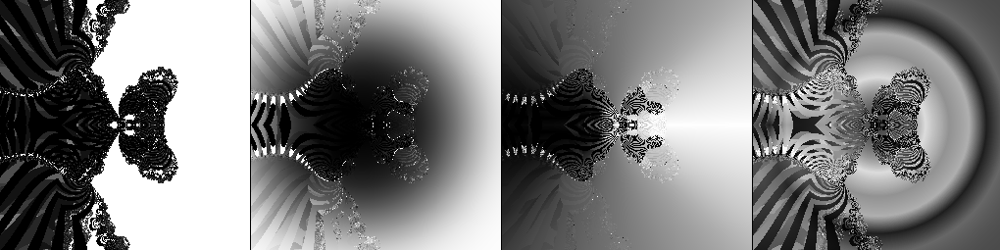

In [2]:
dither_f = 0.1
scale_dist = 12

domain_dict = get_test_domain_dict()
domain_dict['zoom'] = 0.11111
fcn_number = 5

fcn_name, fcn = name_functionhandle_dict[fcn_number][0], name_functionhandle_dict[fcn_number][1]
p = p = fcn(0.0, None)
print(p)
list_tuple = [(fcn, (p))]
p = dither_pars(p, dither_f)
print(p)
display_source(fcn)

domain_dict['max_d'] = scale_dist / domain_dict['zoom']

display_calc_result(list_tuple, domain_dict)

In [ ]:
parameters = [-0.851612290000, 3.2197212063585856, -88.14578913619096]

In [ ]:
# def dither_pars(p, dither_f=0.10):
#     """ Usage: p = dither_pars(p, dither_f=0.10)
#                 dither a parameter set
#     """
#     return p * (1 + np.random.randn(len(p)) * dither_f)

dither_f = 0.1
parameters = [-0.851612290000, 3.2197212063585856, -88.14578913619096]
print(parameters, '\n', dither_pars(parameters, dither_f))

def bugga_bear(Z, p, Z0=None, ET=None):
    """ Z = bugga_bear(Z, p)
    Args:
        Z:    a real or complex number
        p:    a real of complex number
    Returns:
        Z:    the result (complex)
    """
    EPSILON = 1e-15

    if p is None:
        return [-0.851612290000, 3.2197212063585856, -88.14578913619096]
    if Z == 0.0+0.0j:
        return np.Inf
    c = np.sqrt(np.pi)
    try:
        for n in range(1, len(p)+1):
            Zok = np.isfinite(Z)
            if Zok and np.abs(Z) != 0:
                Z = 1 / Z - Z**( n * (Z**p[n-1]) / c)
            elif Zok:
                Z = 1 / EPSILON - Z**( n * (Z**p[n-1] ) / c)
    except:
        pass
    return Z



			parameter set 0 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                      

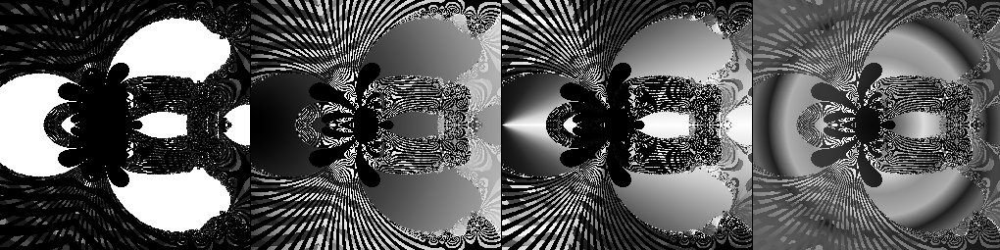

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpn1ti3owo


          bugga_bear: 2.401719 seconds
          parameters: [ -0.90456354   2.95967303 -97.98542961]

             ET                            Zd                            Zr                           All


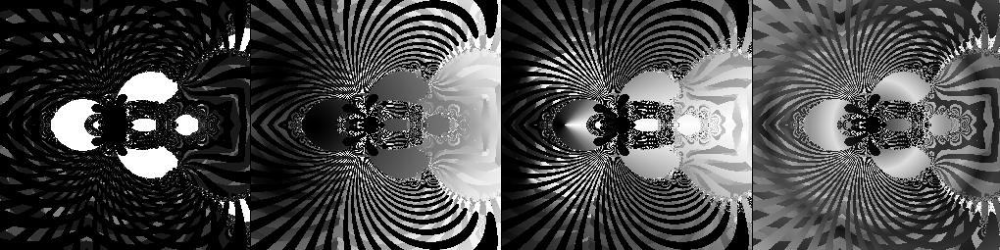

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpwa8vzrpk


          bugga_bear: 2.031149 seconds
          parameters: [ -0.90456354   2.95967303 -97.98542961]

             ET                            Zd                            Zr                           All


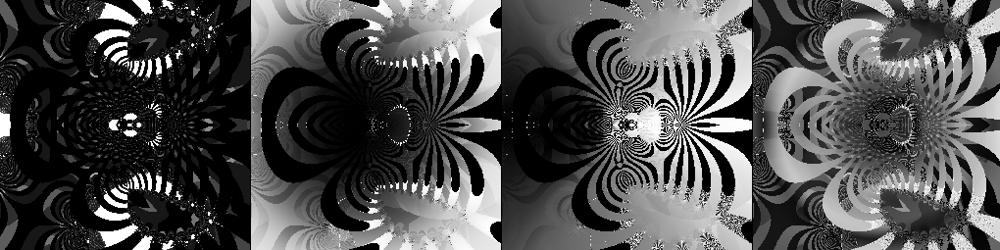

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpvzqtsvm5


          bugga_bear: 0.995122 seconds
          parameters: [ -0.90456354   2.95967303 -97.98542961]

             ET                            Zd                            Zr                           All


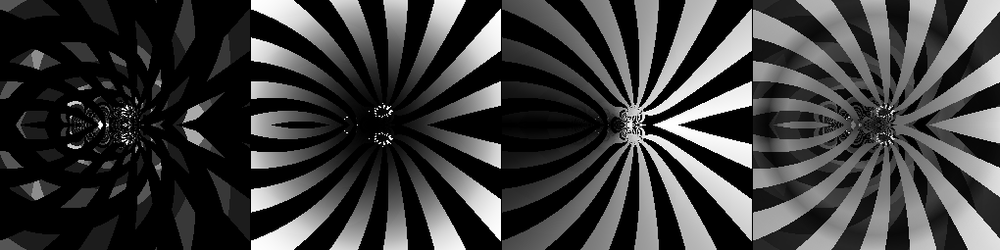



			parameter set 1 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp87ow1lpb


          bugga_bear: 4.390986 seconds
          parameters: [ -0.87151537   3.13123393 -93.08549654]

             ET                            Zd                            Zr                           All


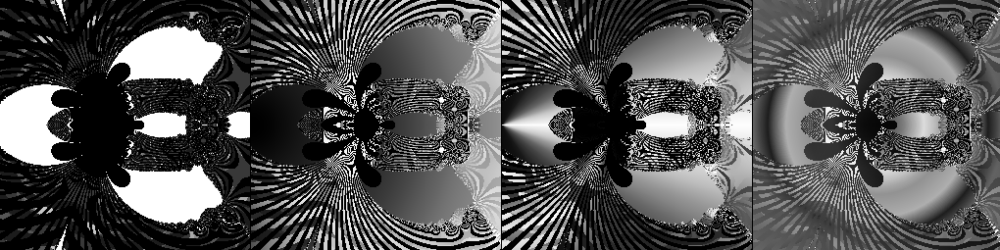

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpc24evn2c


          bugga_bear: 2.254433 seconds
          parameters: [ -0.87151537   3.13123393 -93.08549654]

             ET                            Zd                            Zr                           All


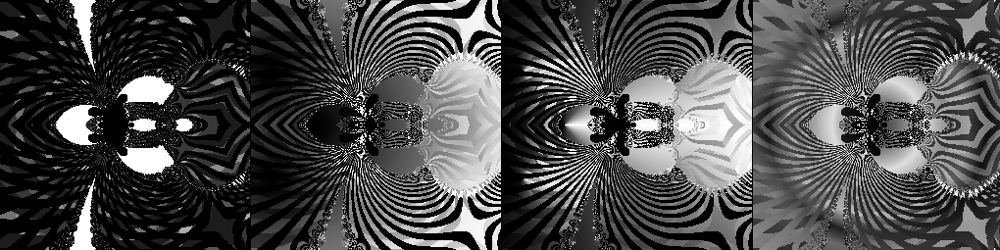

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpqnpx4m8i


          bugga_bear: 3.073818 seconds
          parameters: [ -0.87151537   3.13123393 -93.08549654]

             ET                            Zd                            Zr                           All


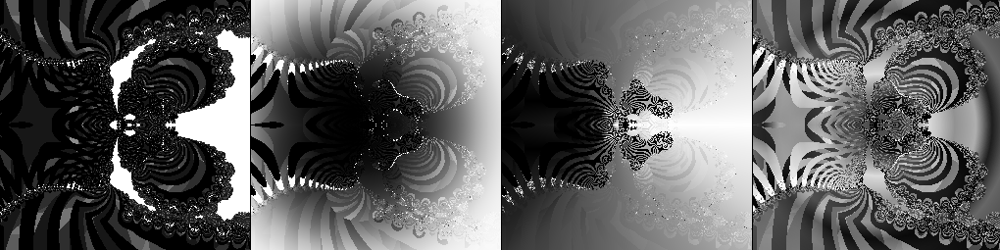

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpku__1tta


          bugga_bear: 6.193998 seconds
          parameters: [ -0.87151537   3.13123393 -93.08549654]

             ET                            Zd                            Zr                           All


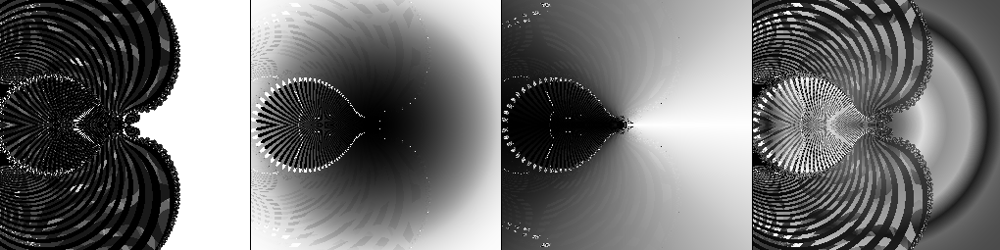



			parameter set 2 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp7141dafq


          bugga_bear: 1.020512 seconds
          parameters: [ -0.9048993    3.34242464 -72.45308385]

             ET                            Zd                            Zr                           All


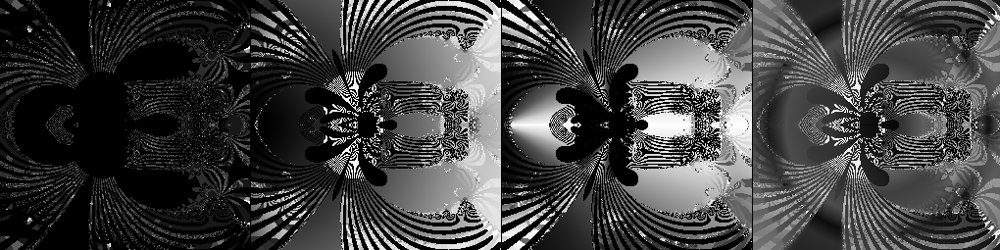

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp_s5uriti


          bugga_bear: 1.124167 seconds
          parameters: [ -0.9048993    3.34242464 -72.45308385]

             ET                            Zd                            Zr                           All


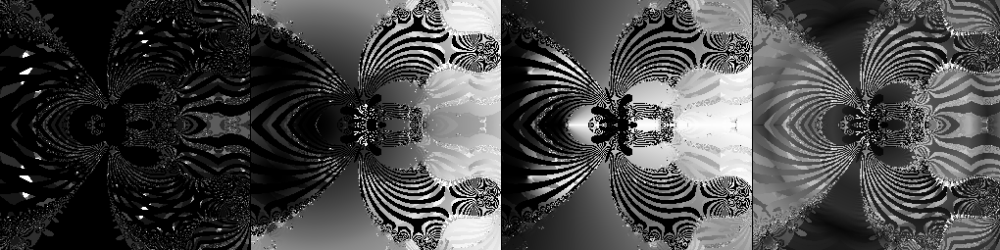

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp9bufeuwx


          bugga_bear: 1.229492 seconds
          parameters: [ -0.9048993    3.34242464 -72.45308385]

             ET                            Zd                            Zr                           All


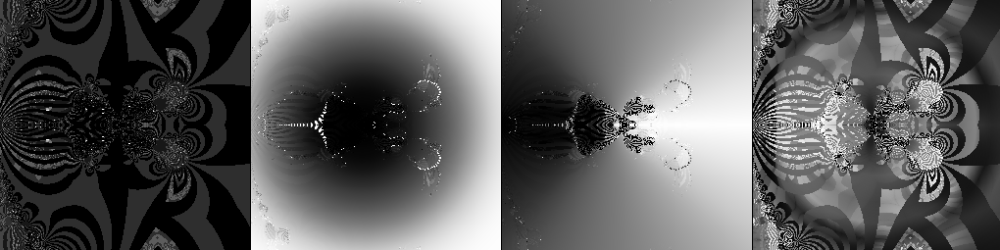

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpo0x7mkod


          bugga_bear: 1.236262 seconds
          parameters: [ -0.9048993    3.34242464 -72.45308385]

             ET                            Zd                            Zr                           All


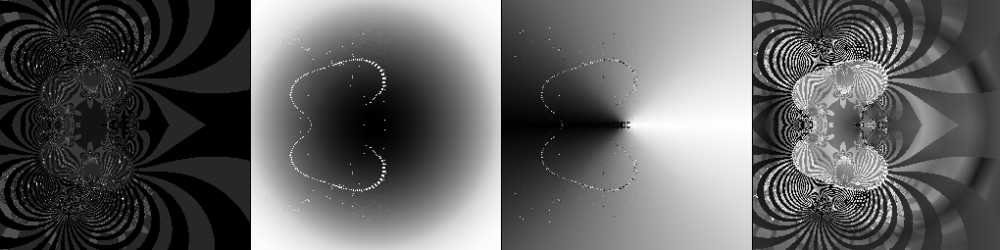



			parameter set 3 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp2pd0iye4


          bugga_bear: 1.014484 seconds
          parameters: [ -0.77139161   3.44990464 -92.20960569]

             ET                            Zd                            Zr                           All


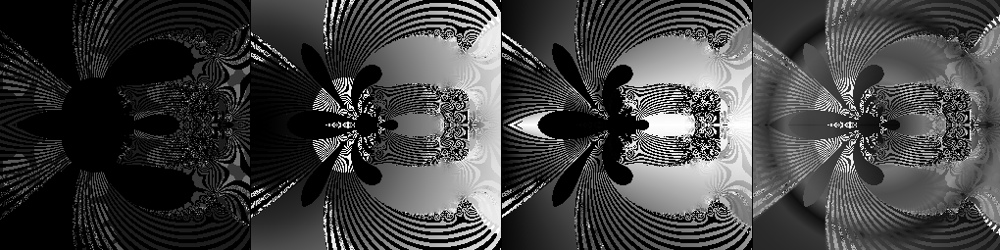

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp4yemkbj2


          bugga_bear: 1.118136 seconds
          parameters: [ -0.77139161   3.44990464 -92.20960569]

             ET                            Zd                            Zr                           All


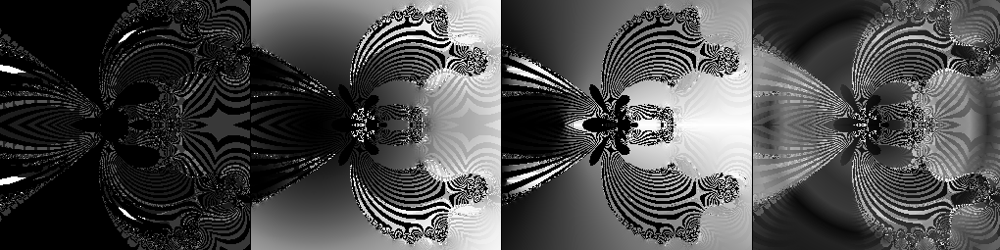

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpl2jvz5q9


          bugga_bear: 1.225268 seconds
          parameters: [ -0.77139161   3.44990464 -92.20960569]

             ET                            Zd                            Zr                           All


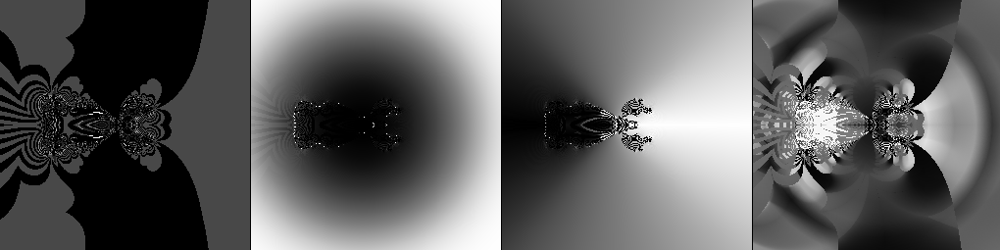

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpr6aydvmc


          bugga_bear: 1.345455 seconds
          parameters: [ -0.77139161   3.44990464 -92.20960569]

             ET                            Zd                            Zr                           All


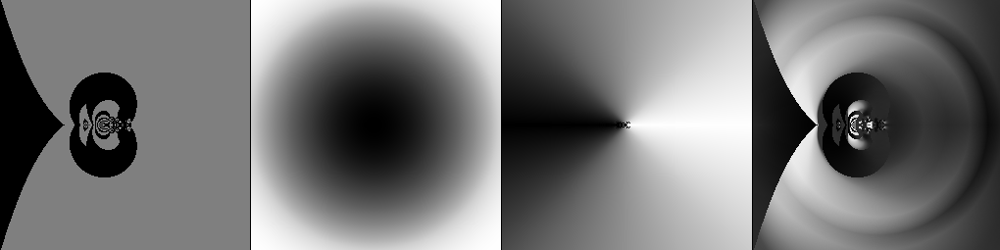



			parameter set 4 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpbilpt1bu


          bugga_bear: 8.829105 seconds
          parameters: [ -0.86281928   2.72516845 -87.77402482]

             ET                            Zd                            Zr                           All


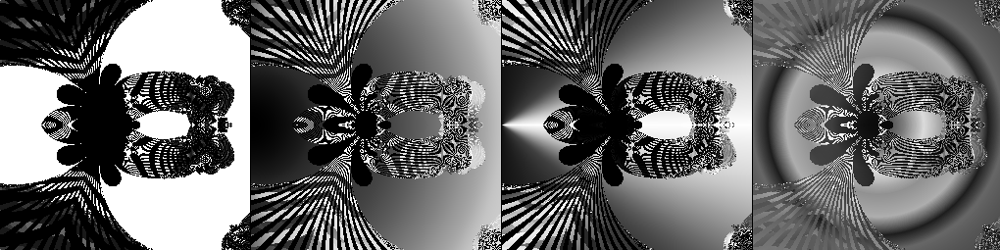

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmplqo23ss_


          bugga_bear: 4.908257 seconds
          parameters: [ -0.86281928   2.72516845 -87.77402482]

             ET                            Zd                            Zr                           All


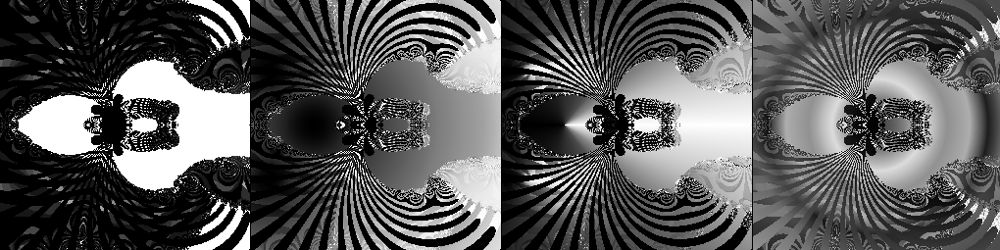

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpt9nlf1lj


          bugga_bear: 10.120098 seconds
          parameters: [ -0.86281928   2.72516845 -87.77402482]

             ET                            Zd                            Zr                           All


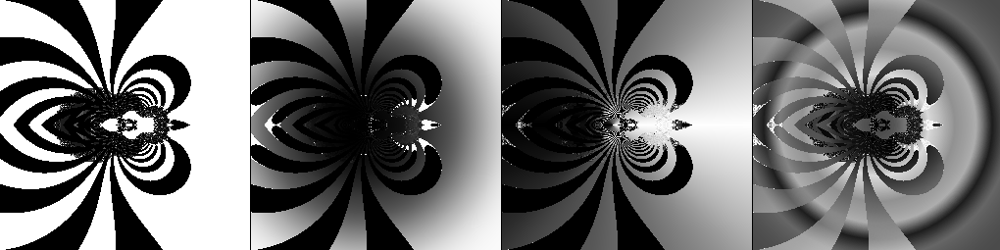

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp1dccbwcg


          bugga_bear: 13.513150 seconds
          parameters: [ -0.86281928   2.72516845 -87.77402482]

             ET                            Zd                            Zr                           All


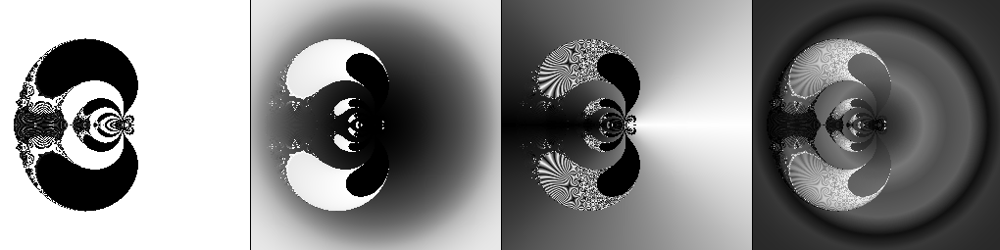



			parameter set 5 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp6n3lwa7q


          bugga_bear: 11.845137 seconds
          parameters: [ -0.87146455   2.45614119 -90.1373283 ]

             ET                            Zd                            Zr                           All


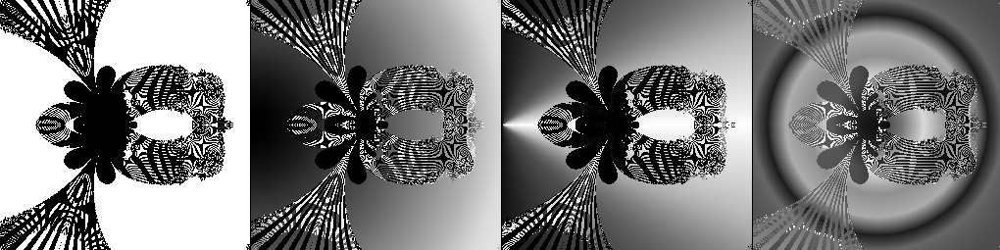

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp0co6phzd


          bugga_bear: 11.165116 seconds
          parameters: [ -0.87146455   2.45614119 -90.1373283 ]

             ET                            Zd                            Zr                           All


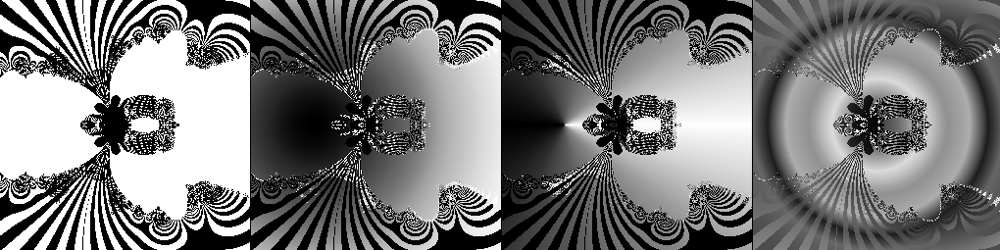

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpurb94pv8


          bugga_bear: 10.674283 seconds
          parameters: [ -0.87146455   2.45614119 -90.1373283 ]

             ET                            Zd                            Zr                           All


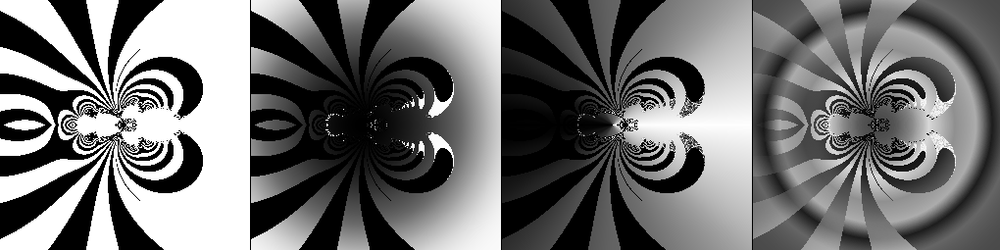

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpkzvxpc23


          bugga_bear: 11.711587 seconds
          parameters: [ -0.87146455   2.45614119 -90.1373283 ]

             ET                            Zd                            Zr                           All


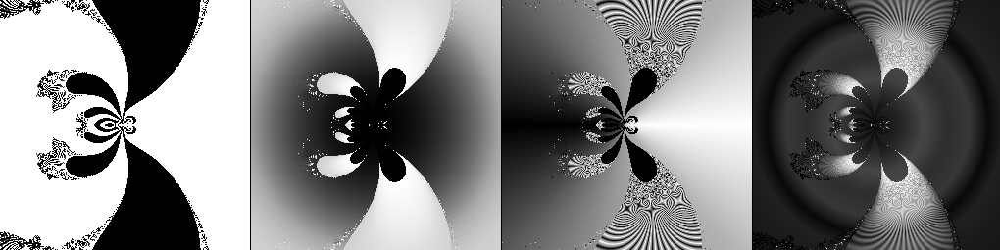



			parameter set 6 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpvn1h7ofs


          bugga_bear: 1.037789 seconds
          parameters: [ -0.84722495   3.43198634 -98.52152314]

             ET                            Zd                            Zr                           All


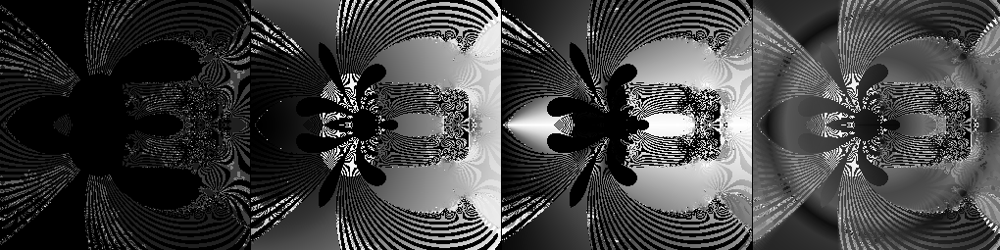

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpcndjw1is


          bugga_bear: 1.145021 seconds
          parameters: [ -0.84722495   3.43198634 -98.52152314]

             ET                            Zd                            Zr                           All


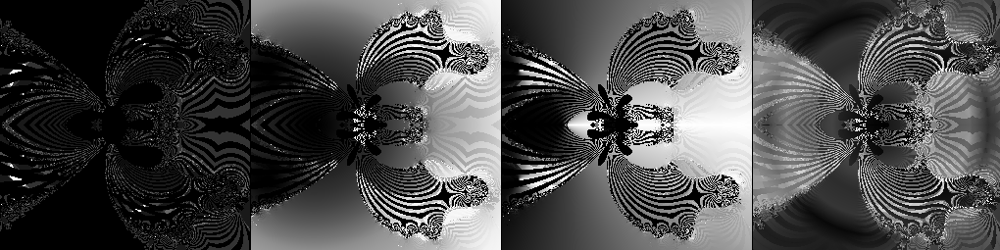

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpw4j2_tsc


          bugga_bear: 1.057883 seconds
          parameters: [ -0.84722495   3.43198634 -98.52152314]

             ET                            Zd                            Zr                           All


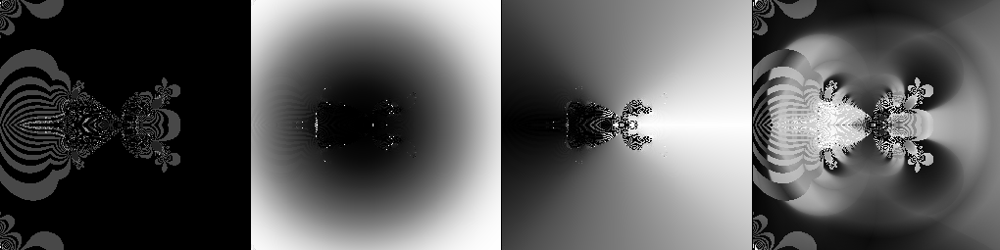

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpyunzws0_


          bugga_bear: 1.182456 seconds
          parameters: [ -0.84722495   3.43198634 -98.52152314]

             ET                            Zd                            Zr                           All


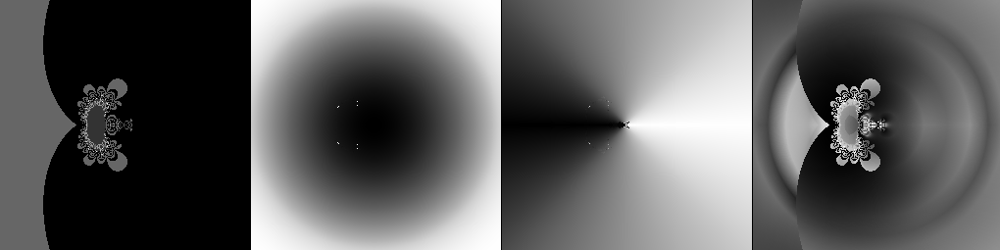



			parameter set 7 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp_5rvinz0


          bugga_bear: 5.383029 seconds
          parameters: [  -0.78685987    3.24117277 -101.26995436]

             ET                            Zd                            Zr                           All


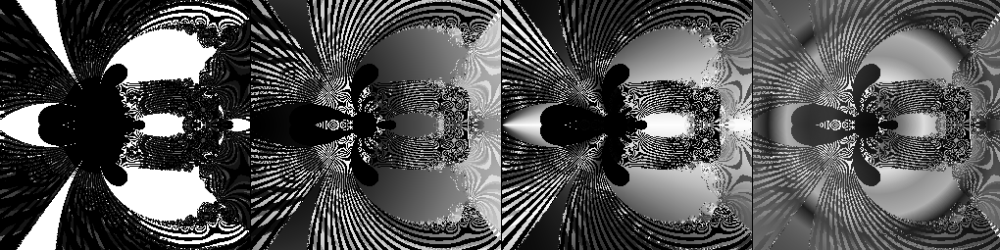

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp7__kbkm0


          bugga_bear: 3.768165 seconds
          parameters: [  -0.78685987    3.24117277 -101.26995436]

             ET                            Zd                            Zr                           All


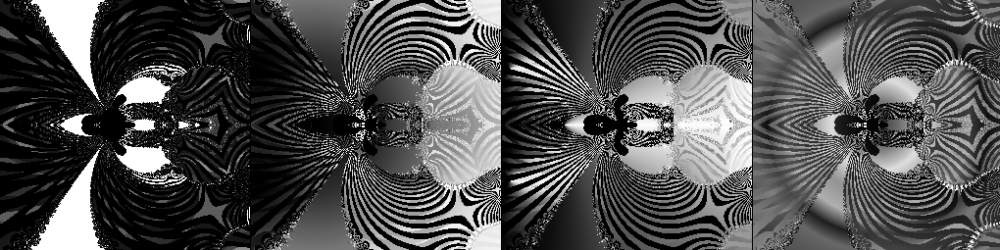

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpc5bxwbde


          bugga_bear: 9.090625 seconds
          parameters: [  -0.78685987    3.24117277 -101.26995436]

             ET                            Zd                            Zr                           All


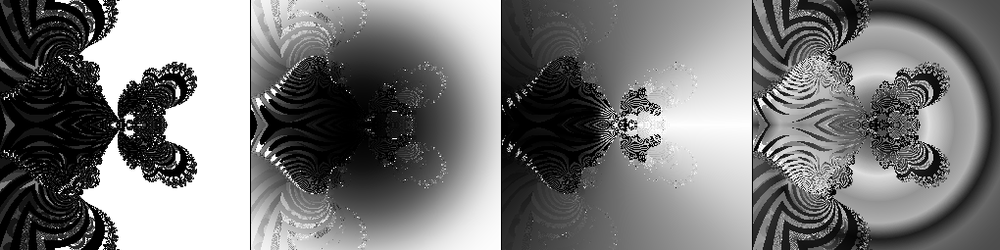

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp0k491mi4


          bugga_bear: 12.529651 seconds
          parameters: [  -0.78685987    3.24117277 -101.26995436]

             ET                            Zd                            Zr                           All


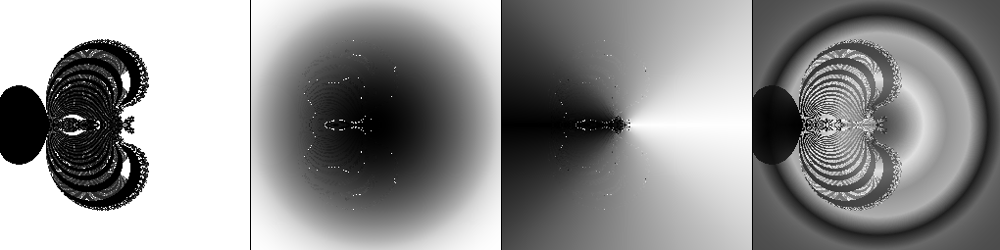



			parameter set 8 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpei8pfr1e


          bugga_bear: 9.654580 seconds
          parameters: [  -0.78851536    2.65550134 -102.39063062]

             ET                            Zd                            Zr                           All


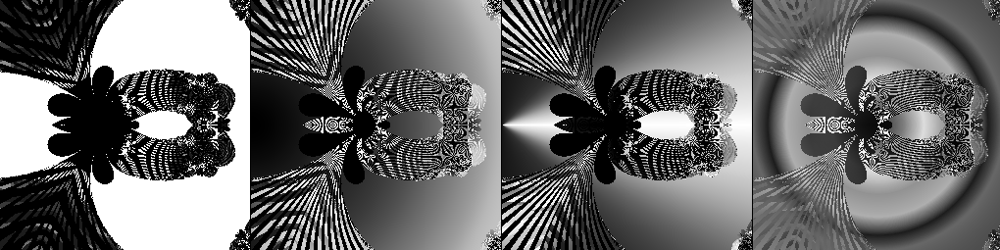

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp40uj9nqc


          bugga_bear: 6.905245 seconds
          parameters: [  -0.78851536    2.65550134 -102.39063062]

             ET                            Zd                            Zr                           All


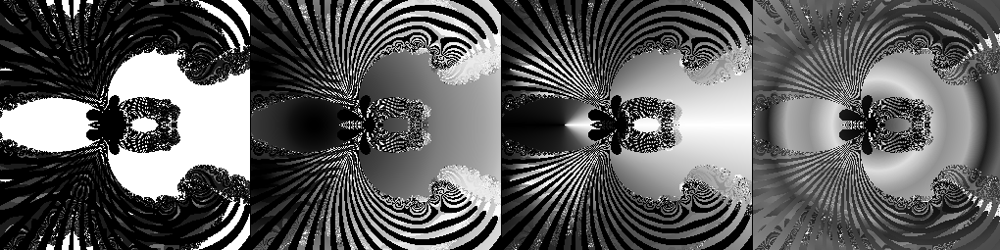

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp8q_si69i


          bugga_bear: 8.203105 seconds
          parameters: [  -0.78851536    2.65550134 -102.39063062]

             ET                            Zd                            Zr                           All


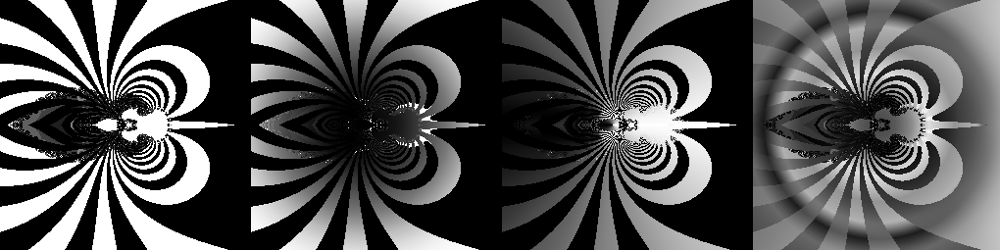

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp92dy8q_9


          bugga_bear: 8.652484 seconds
          parameters: [  -0.78851536    2.65550134 -102.39063062]

             ET                            Zd                            Zr                           All


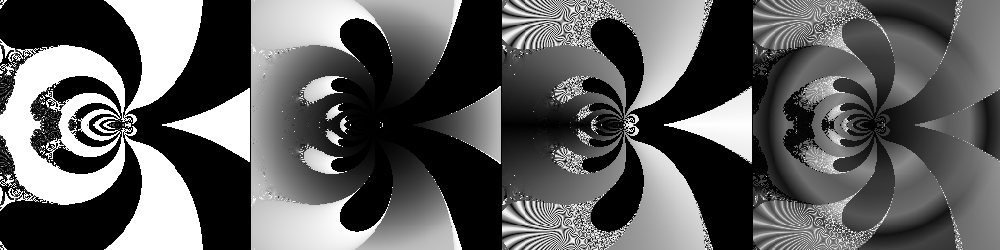



			parameter set 9 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpgzwzvtqe


          bugga_bear: 1.413068 seconds
          parameters: [ -0.92020847   3.22102218 -87.95605572]

             ET                            Zd                            Zr                           All


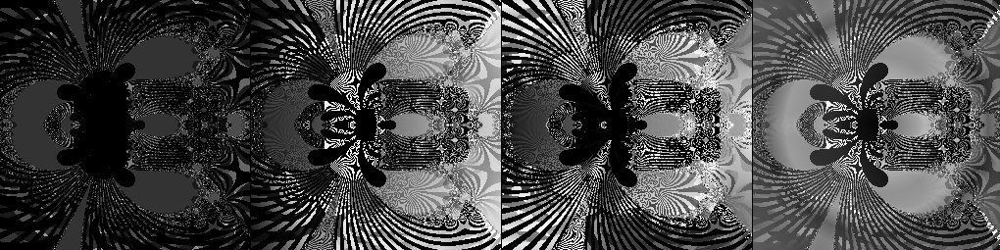

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp9sd7rssg


          bugga_bear: 1.294298 seconds
          parameters: [ -0.92020847   3.22102218 -87.95605572]

             ET                            Zd                            Zr                           All


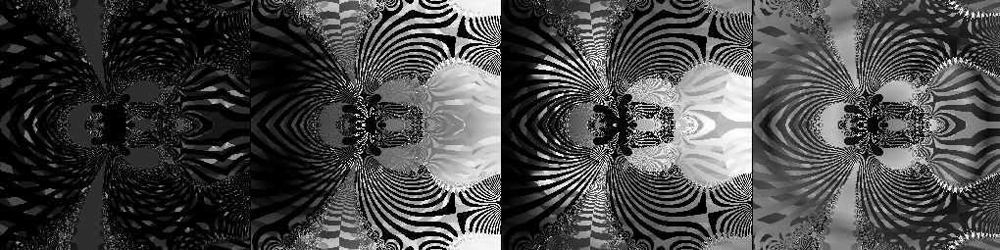

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpiodw2zog


          bugga_bear: 1.698871 seconds
          parameters: [ -0.92020847   3.22102218 -87.95605572]

             ET                            Zd                            Zr                           All


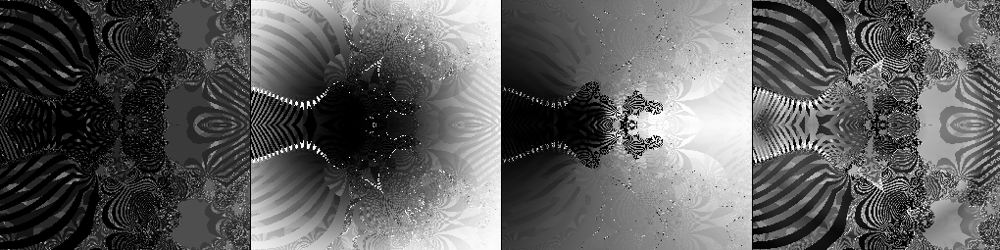

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpuef8n5ti


          bugga_bear: 1.790140 seconds
          parameters: [ -0.92020847   3.22102218 -87.95605572]

             ET                            Zd                            Zr                           All


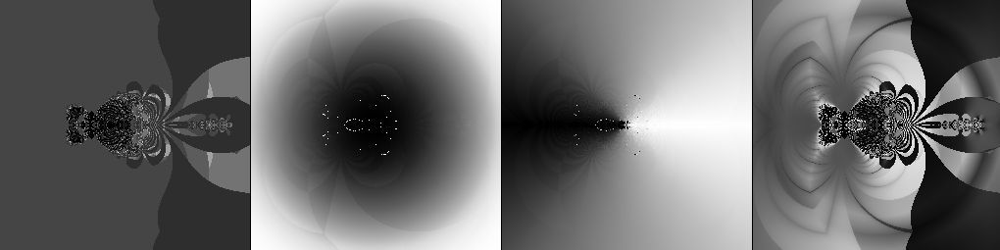

In [3]:
"""
                    bugga_bear exploration - parameters
"""
dither_f = 0.1
number_p_variations = 10

parameters = [-0.851612290000, 3.2197212063585856, -88.14578913619096]
# scale dist == multiplier of domain diagonal to get escape distance
scale_dist = 12

domain_dict = get_test_domain_dict()
fcn_number = 5

fcn_name, fcn = name_functionhandle_dict[fcn_number][0], name_functionhandle_dict[fcn_number][1]
display_source(fcn)
for k in range(number_p_variations):
    p = dither_pars(parameters, dither_f)
    list_tuple = [(fcn, (p))]
    print('\n\n\t\t\tparameter set %i of %i\n'%(k, number_p_variations))
    zoom_fact_list = [1/((1+k)**k) for k in range(0, 4)]

    n_to_go = len(zoom_fact_list)
    print('Zoom %i times'%(n_to_go))

    for zoom_fact in zoom_fact_list:
        domain_dict['zoom'] = zoom_fact
        domain_dict['max_d'] = scale_dist / domain_dict['zoom']
        print('\t\t%i to go'%(n_to_go))
        n_to_go -= 1
        display_calc_result(list_tuple, domain_dict)

def bugga_bear(Z, p, Z0=None, ET=None):
    """ Z = bugga_bear(Z, p)
    Args:
        Z:    a real or complex number
        p:    a real of complex number
    Returns:
        Z:    the result (complex)
    """
    EPSILON = 1e-15

    if p is None:
        return [-0.851612290000, 3.2197212063585856, -88.14578913619096]
    if Z == 0.0+0.0j:
        return np.Inf
    c = np.sqrt(np.pi)
    try:
        for n in range(1, len(p)+1):
            Zok = np.isfinite(Z)
            if Zok and np.abs(Z) != 0:
                Z = 1 / Z - Z**( n * (Z**p[n-1]) / c)
            elif Zok:
                Z = 1 / EPSILON - Z**( n * (Z**p[n-1] ) / c)
    except:
        pass
    return Z



			parameter set 0 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                      

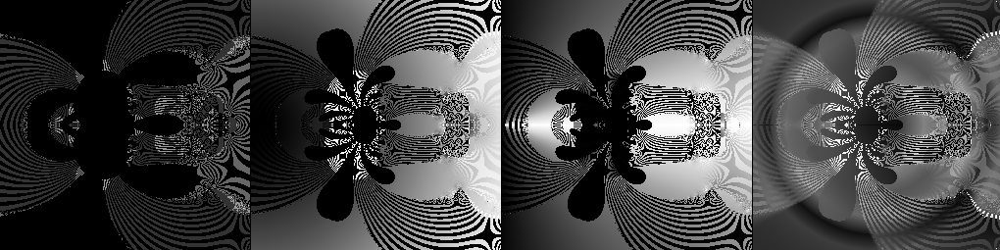

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpp2sf5fzu


          bugga_bear: 1.031257 seconds
          parameters: [ -0.923769     3.73628618 -99.60889974]

             ET                            Zd                            Zr                           All


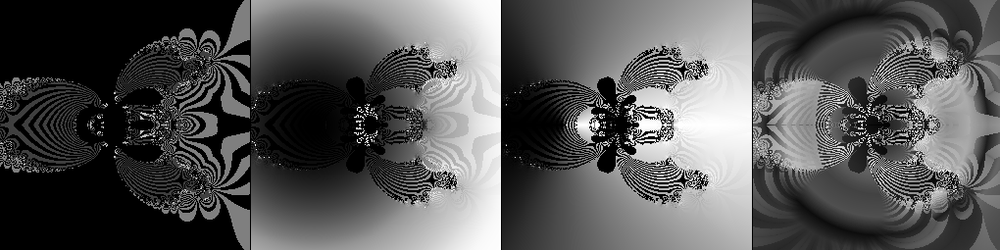

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpy7qbng8o


          bugga_bear: 1.106009 seconds
          parameters: [ -0.923769     3.73628618 -99.60889974]

             ET                            Zd                            Zr                           All


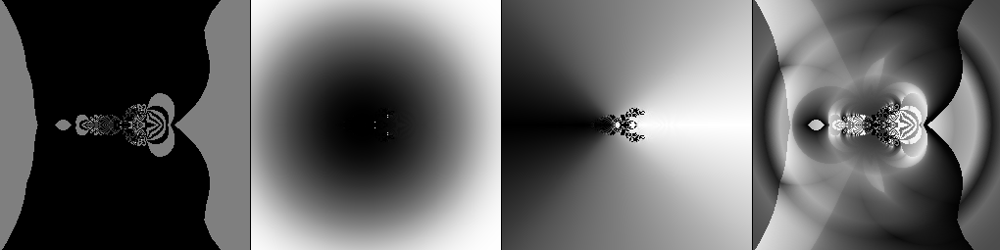

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpz3q5wurt


          bugga_bear: 1.093312 seconds
          parameters: [ -0.923769     3.73628618 -99.60889974]

             ET                            Zd                            Zr                           All


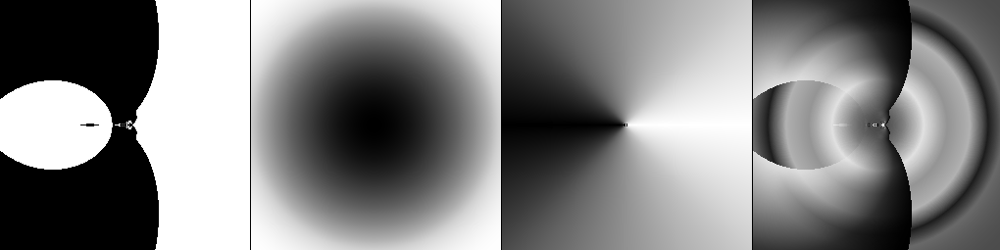



			parameter set 1 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpqjknmiwp


          bugga_bear: 2.846267 seconds
          parameters: [  -1.20186535    3.3401116  -120.18132327]

             ET                            Zd                            Zr                           All


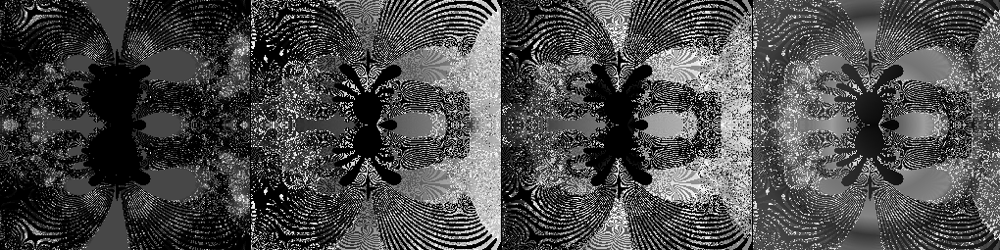

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp2o2flvqx


          bugga_bear: 3.711940 seconds
          parameters: [  -1.20186535    3.3401116  -120.18132327]

             ET                            Zd                            Zr                           All


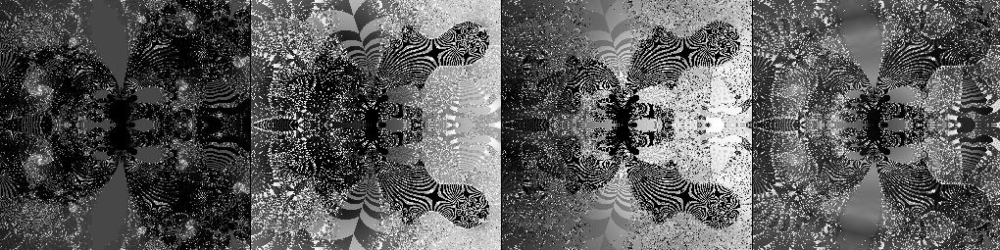

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp19fbg49p


          bugga_bear: 5.563293 seconds
          parameters: [  -1.20186535    3.3401116  -120.18132327]

             ET                            Zd                            Zr                           All


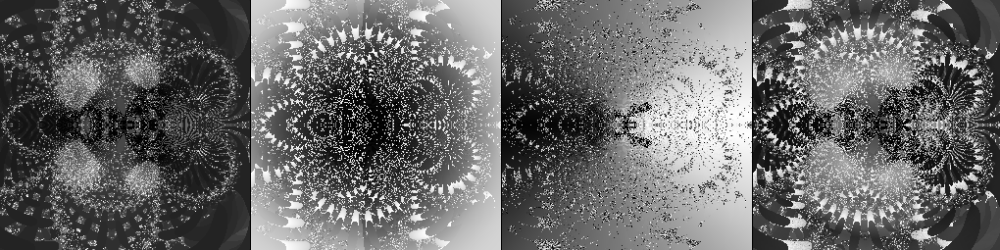

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpnkghnovb


          bugga_bear: 3.267247 seconds
          parameters: [  -1.20186535    3.3401116  -120.18132327]

             ET                            Zd                            Zr                           All


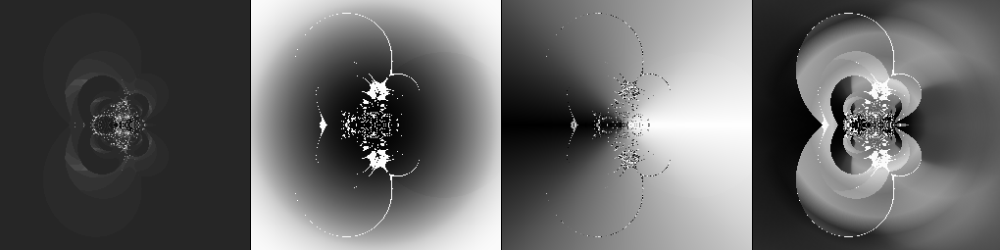



			parameter set 2 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp5ocl3k9g


          bugga_bear: 0.909321 seconds
          parameters: [ -0.91991541   3.98379703 -80.75640316]

             ET                            Zd                            Zr                           All


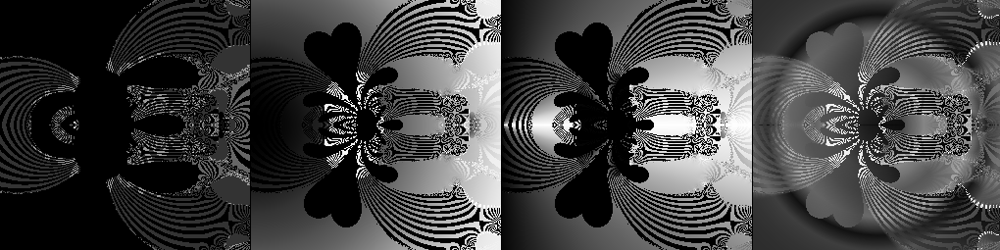

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp9ufiguzy


          bugga_bear: 1.007516 seconds
          parameters: [ -0.91991541   3.98379703 -80.75640316]

             ET                            Zd                            Zr                           All


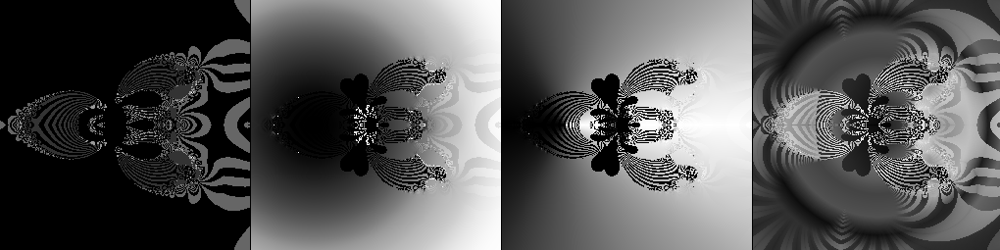

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpb1e5g4qp


          bugga_bear: 1.122374 seconds
          parameters: [ -0.91991541   3.98379703 -80.75640316]

             ET                            Zd                            Zr                           All


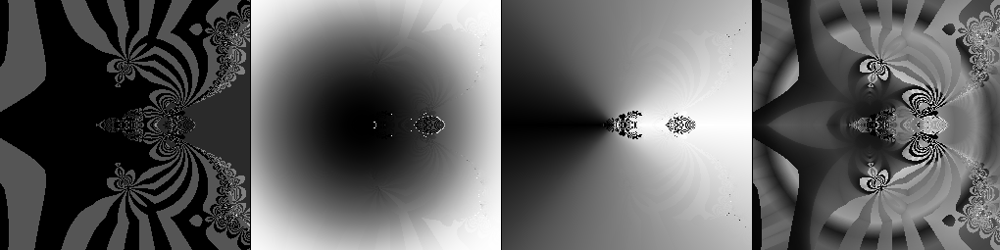

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpl30hldct


          bugga_bear: 1.337279 seconds
          parameters: [ -0.91991541   3.98379703 -80.75640316]

             ET                            Zd                            Zr                           All


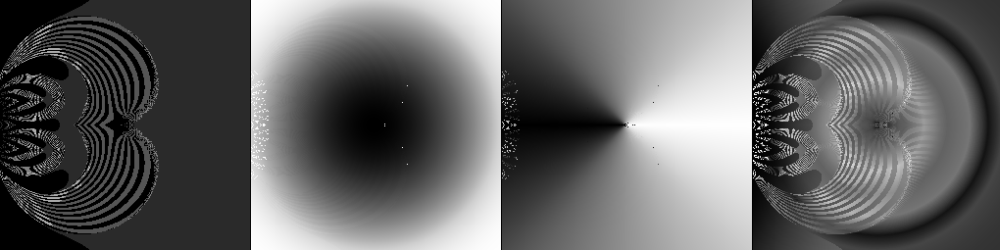



			parameter set 3 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp54jakvqm


          bugga_bear: 9.498601 seconds
          parameters: [ -0.94975137   3.59060032 -61.47383633]

             ET                            Zd                            Zr                           All


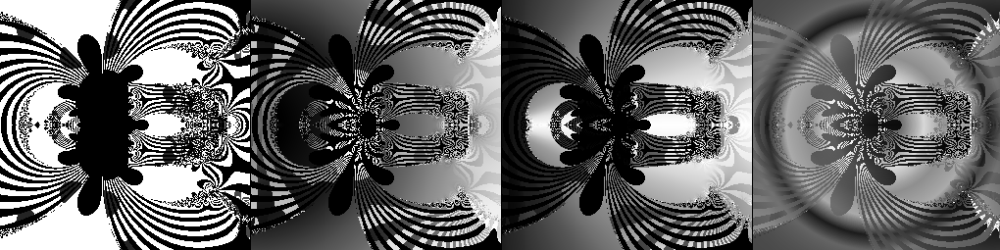

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpa7mc5xs2


          bugga_bear: 11.366994 seconds
          parameters: [ -0.94975137   3.59060032 -61.47383633]

             ET                            Zd                            Zr                           All


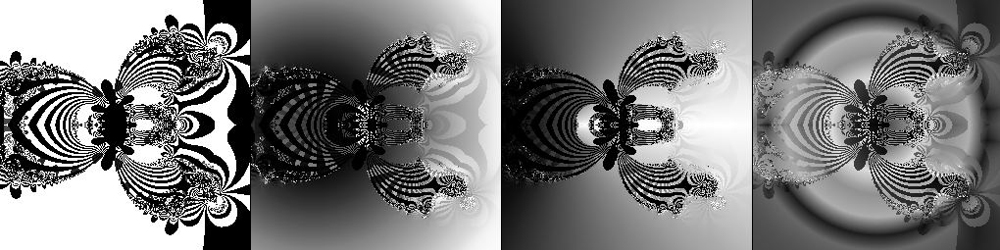

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpxbi_v6fp


          bugga_bear: 15.583699 seconds
          parameters: [ -0.94975137   3.59060032 -61.47383633]

             ET                            Zd                            Zr                           All


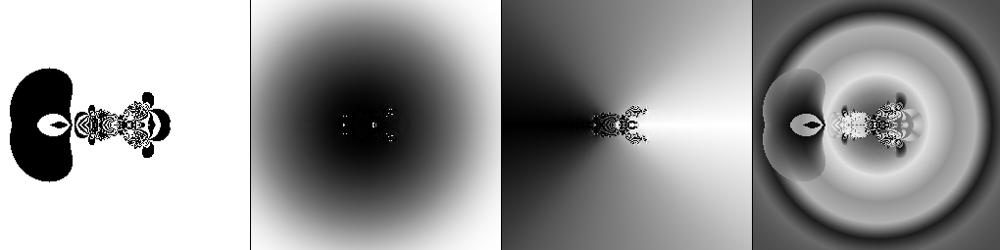

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpo4k_clw6


          bugga_bear: 17.035996 seconds
          parameters: [ -0.94975137   3.59060032 -61.47383633]

             ET                            Zd                            Zr                           All


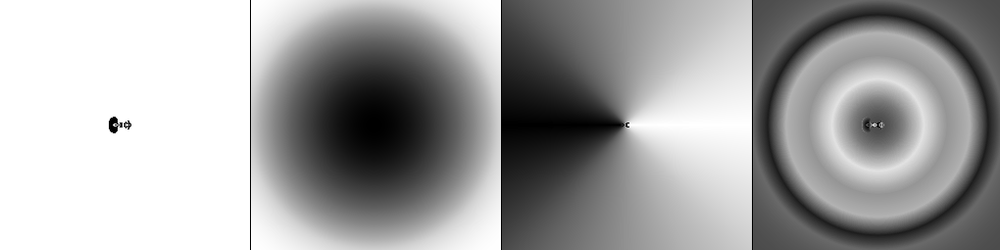



			parameter set 4 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp3s_k4xvp


          bugga_bear: 1.014308 seconds
          parameters: [  -1.10615996    3.16222318 -104.89464315]

             ET                            Zd                            Zr                           All


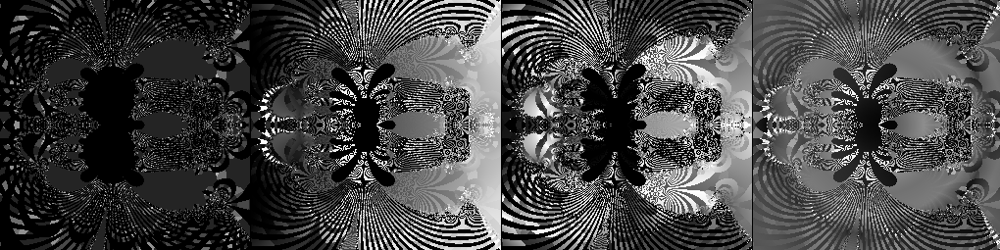

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpjorbwxa4


          bugga_bear: 1.013306 seconds
          parameters: [  -1.10615996    3.16222318 -104.89464315]

             ET                            Zd                            Zr                           All


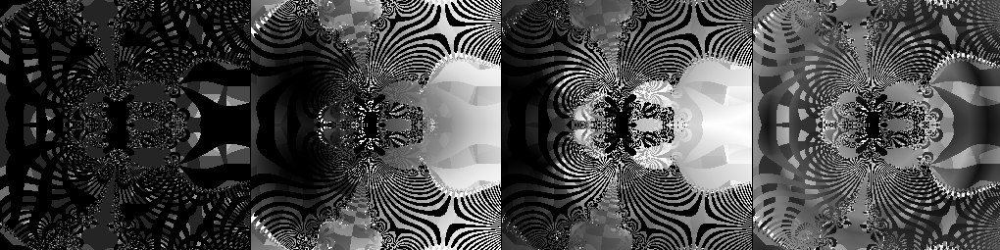

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpk78qd61n


          bugga_bear: 1.216152 seconds
          parameters: [  -1.10615996    3.16222318 -104.89464315]

             ET                            Zd                            Zr                           All


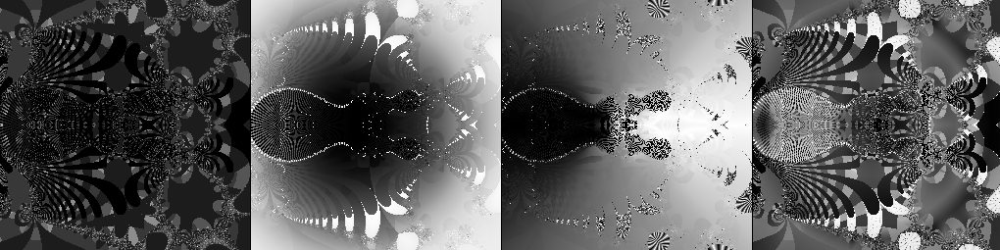

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpr0e3c9ti


          bugga_bear: 1.221325 seconds
          parameters: [  -1.10615996    3.16222318 -104.89464315]

             ET                            Zd                            Zr                           All


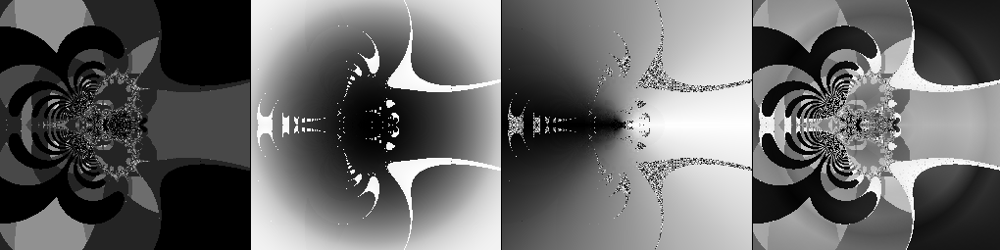



			parameter set 5 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpn6f8sayj


          bugga_bear: 15.276252 seconds
          parameters: [ -0.71210516   1.91171706 -43.2142637 ]

             ET                            Zd                            Zr                           All


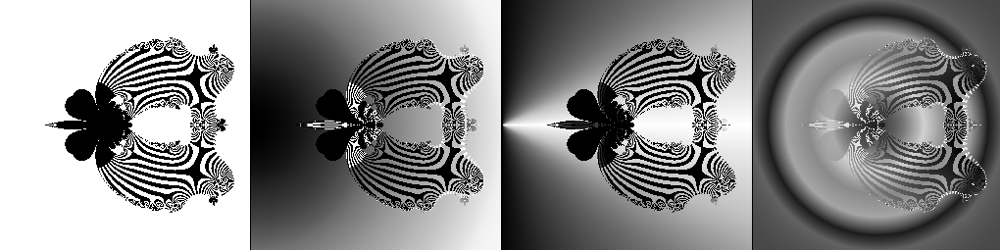

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpr1yqzr1c


          bugga_bear: 16.957731 seconds
          parameters: [ -0.71210516   1.91171706 -43.2142637 ]

             ET                            Zd                            Zr                           All


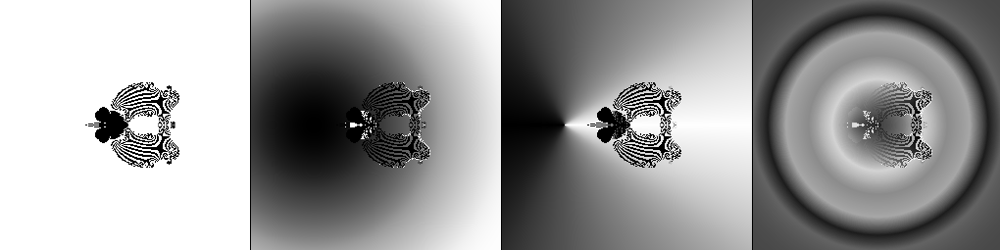

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpdr5tt5_3


          bugga_bear: 17.445177 seconds
          parameters: [ -0.71210516   1.91171706 -43.2142637 ]

             ET                            Zd                            Zr                           All


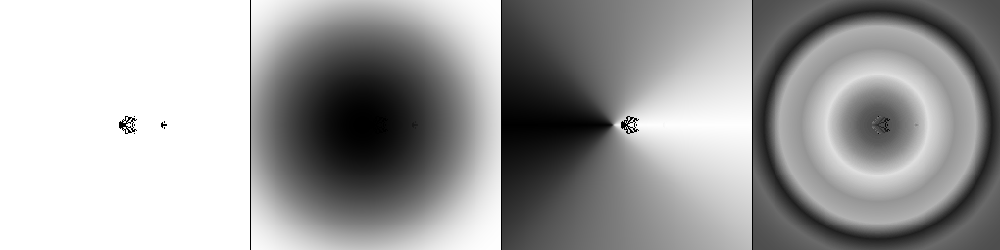

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp8guylkg5


          bugga_bear: 17.180861 seconds
          parameters: [ -0.71210516   1.91171706 -43.2142637 ]

             ET                            Zd                            Zr                           All


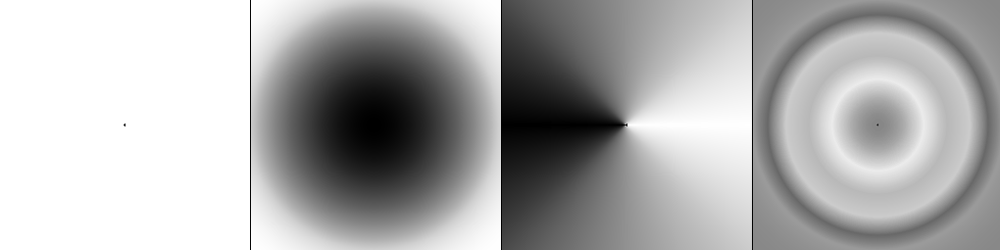



			parameter set 6 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp7s05sib6


          bugga_bear: 11.485007 seconds
          parameters: [ -0.8572931    2.47358259 -57.66796882]

             ET                            Zd                            Zr                           All


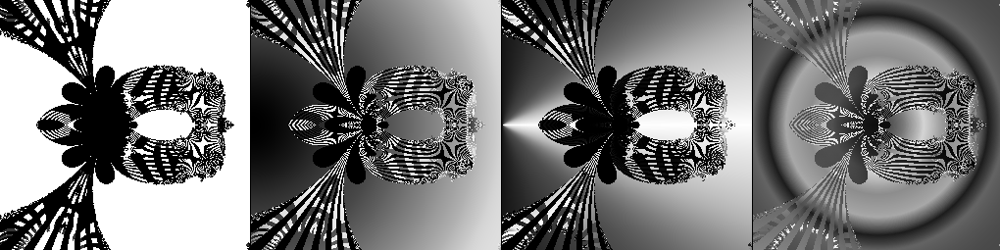

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp5fktzwlk


          bugga_bear: 10.561678 seconds
          parameters: [ -0.8572931    2.47358259 -57.66796882]

             ET                            Zd                            Zr                           All


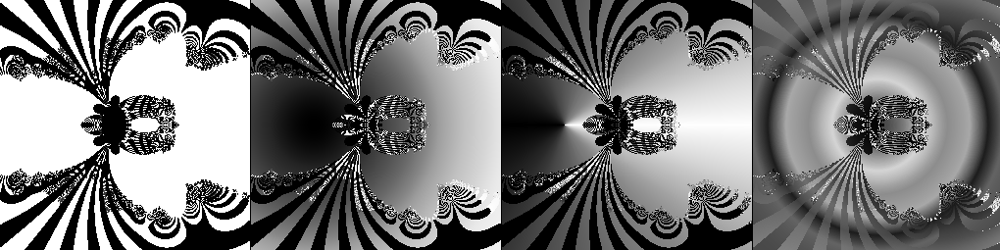

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp8a4bhmc4


          bugga_bear: 10.628193 seconds
          parameters: [ -0.8572931    2.47358259 -57.66796882]

             ET                            Zd                            Zr                           All


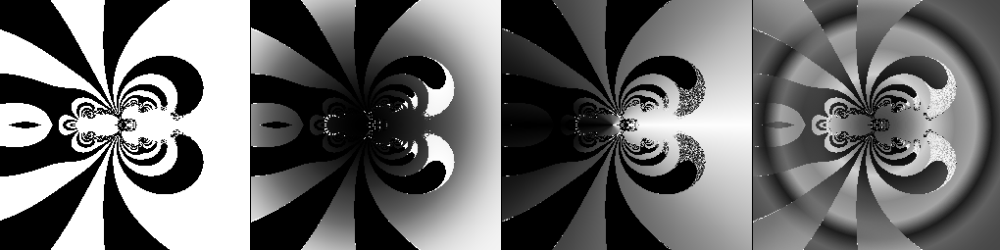

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpdhijbgdn


          bugga_bear: 10.474199 seconds
          parameters: [ -0.8572931    2.47358259 -57.66796882]

             ET                            Zd                            Zr                           All


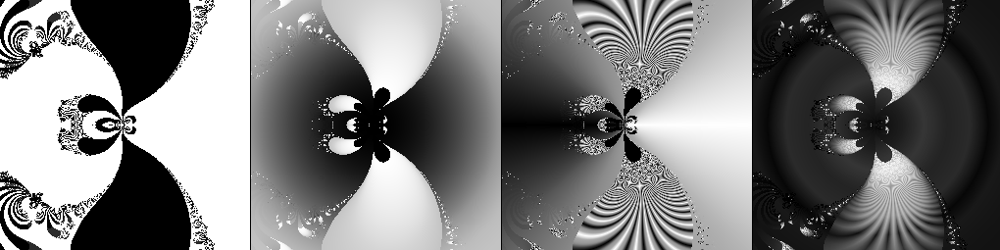



			parameter set 7 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpm_yb4og5


          bugga_bear: 1.398303 seconds
          parameters: [ -0.56984265   2.59339089 -62.13111763]

             ET                            Zd                            Zr                           All


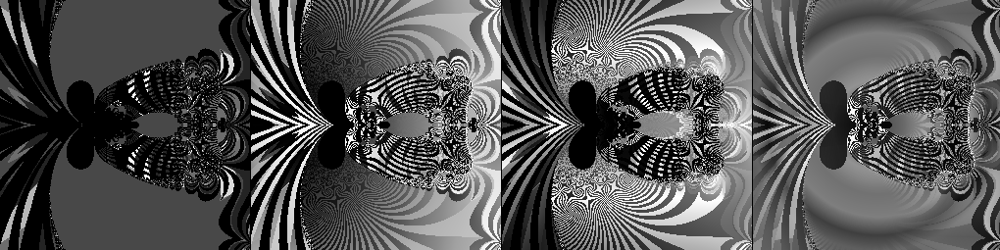

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmprcwpivva


          bugga_bear: 1.183300 seconds
          parameters: [ -0.56984265   2.59339089 -62.13111763]

             ET                            Zd                            Zr                           All


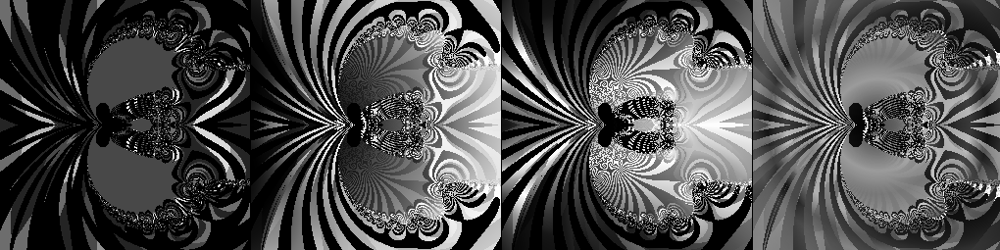

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpqwhe99cd


          bugga_bear: 1.149407 seconds
          parameters: [ -0.56984265   2.59339089 -62.13111763]

             ET                            Zd                            Zr                           All


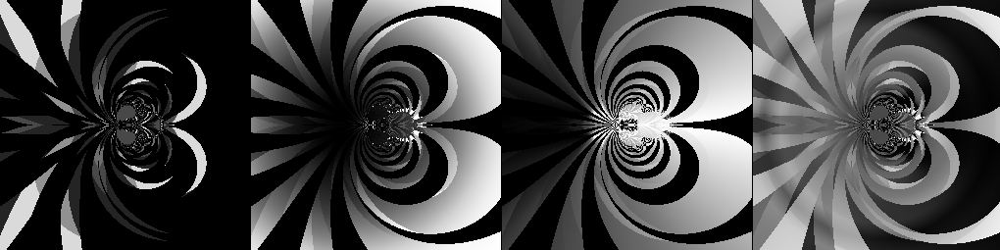

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp8xed0q8o


          bugga_bear: 1.156740 seconds
          parameters: [ -0.56984265   2.59339089 -62.13111763]

             ET                            Zd                            Zr                           All


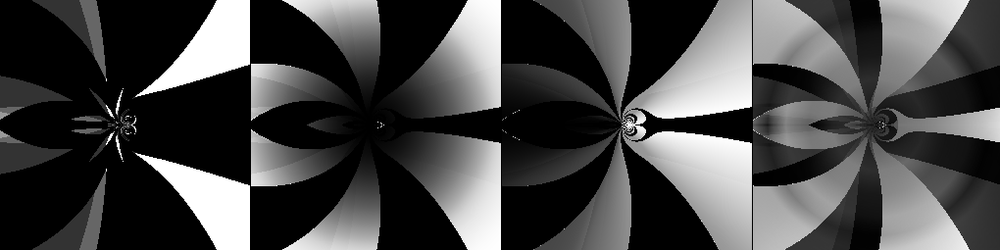



			parameter set 8 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpzhz4e5sw


          bugga_bear: 1.045239 seconds
          parameters: [ -0.77782548   4.10558777 -89.71982057]

             ET                            Zd                            Zr                           All


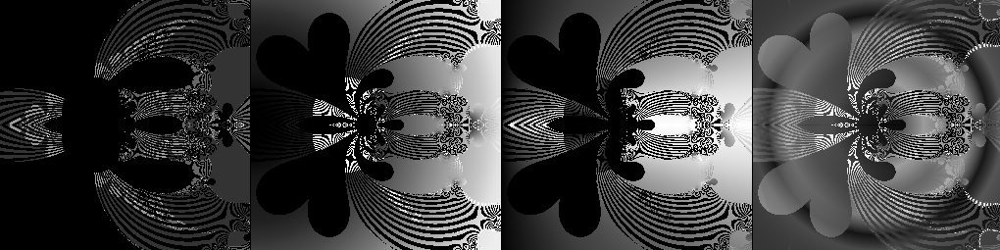

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmprrt735x0


          bugga_bear: 1.052548 seconds
          parameters: [ -0.77782548   4.10558777 -89.71982057]

             ET                            Zd                            Zr                           All


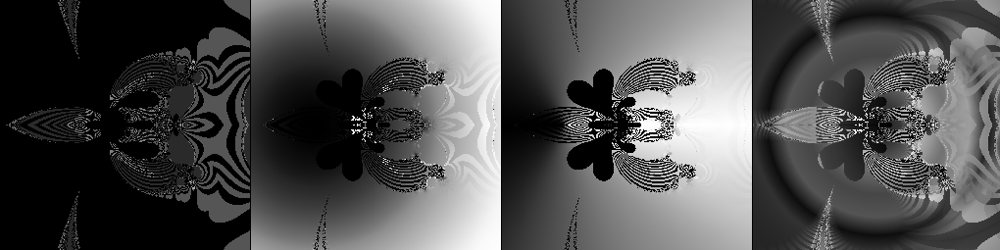

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpubhgvv2m


          bugga_bear: 1.154368 seconds
          parameters: [ -0.77782548   4.10558777 -89.71982057]

             ET                            Zd                            Zr                           All


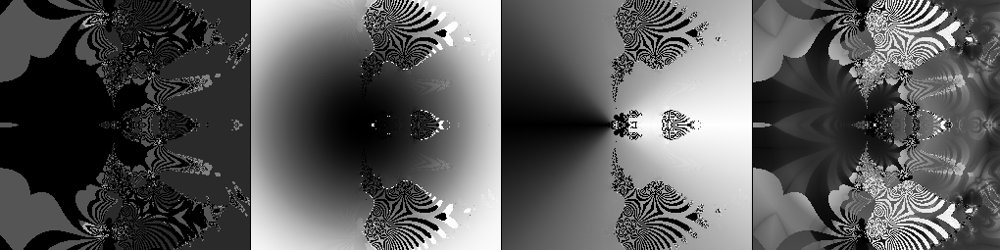

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmps8kegl7o


          bugga_bear: 1.128459 seconds
          parameters: [ -0.77782548   4.10558777 -89.71982057]

             ET                            Zd                            Zr                           All


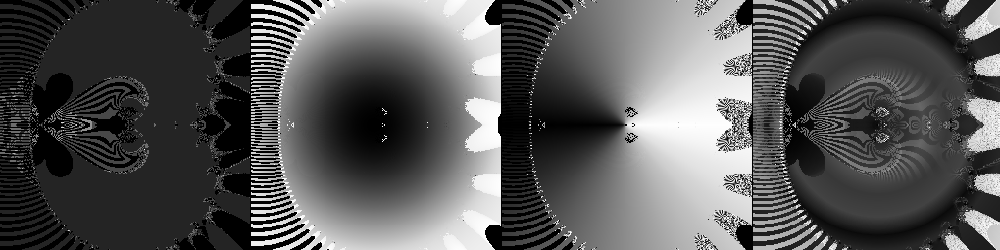



			parameter set 9 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpla5zraz7


          bugga_bear: 1.025994 seconds
          parameters: [ -0.36421488   1.09121788 -61.16351066]

             ET                            Zd                            Zr                           All


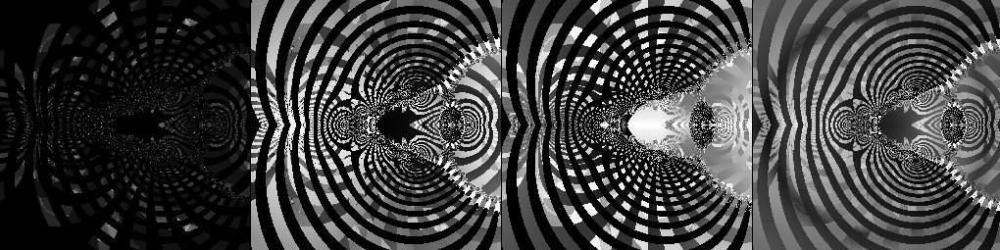

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpni6akh8r


          bugga_bear: 1.048191 seconds
          parameters: [ -0.36421488   1.09121788 -61.16351066]

             ET                            Zd                            Zr                           All


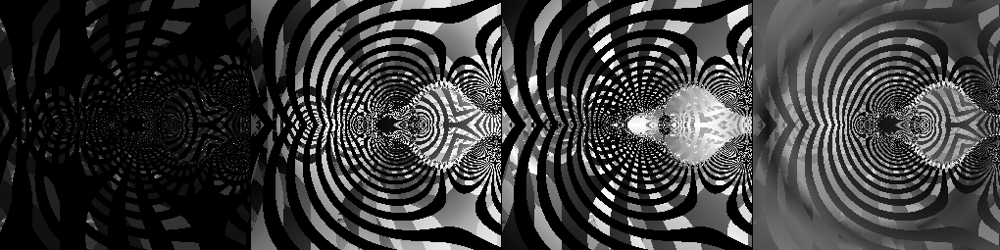

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpl57c1lks


          bugga_bear: 1.140704 seconds
          parameters: [ -0.36421488   1.09121788 -61.16351066]

             ET                            Zd                            Zr                           All


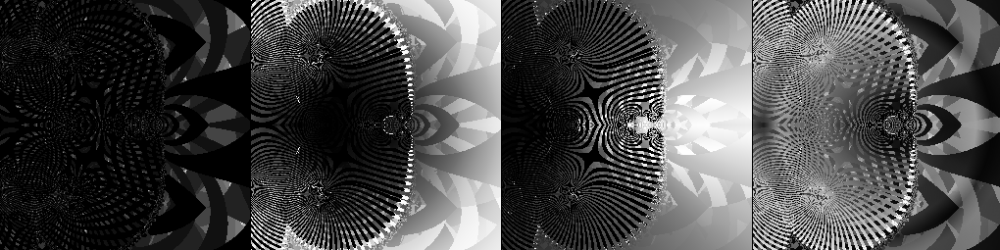

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpcr444k3d


          bugga_bear: 1.140471 seconds
          parameters: [ -0.36421488   1.09121788 -61.16351066]

             ET                            Zd                            Zr                           All


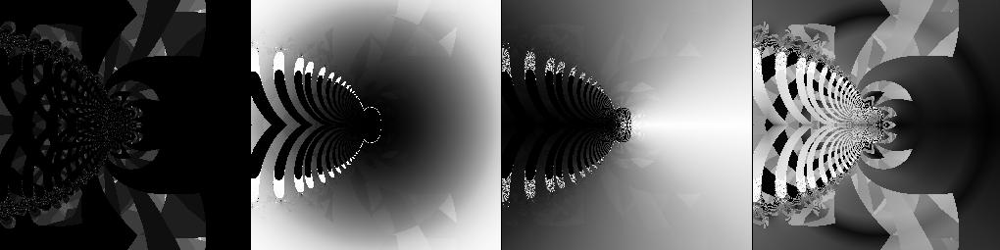

In [4]:
"""
                    bugga_bear exploration - parameters
"""
dither_f = 0.3
number_p_variations = 10

parameters = [-0.851612290000, 3.2197212063585856, -88.14578913619096]
# scale dist == multiplier of domain diagonal to get escape distance
scale_dist = 12

domain_dict = get_test_domain_dict()
fcn_number = 5

fcn_name, fcn = name_functionhandle_dict[fcn_number][0], name_functionhandle_dict[fcn_number][1]
display_source(fcn)
for k in range(number_p_variations):
    # p = p = fcn(0.0, None)
    p = dither_pars(parameters, dither_f)
    list_tuple = [(fcn, (p))]
    print('\n\n\t\t\tparameter set %i of %i\n'%(k, number_p_variations))
    zoom_fact_list = [1/((1+k)**k) for k in range(0, 4)]

    n_to_go = len(zoom_fact_list)
    print('Zoom %i times'%(n_to_go))

    for zoom_fact in zoom_fact_list:
        domain_dict['zoom'] = zoom_fact
        domain_dict['max_d'] = scale_dist / domain_dict['zoom']
        print('\t\t%i to go'%(n_to_go))
        n_to_go -= 1
        display_calc_result(list_tuple, domain_dict)

def bugga_bear(Z, p, Z0=None, ET=None):
    """ Z = bugga_bear(Z, p)
    Args:
        Z:    a real or complex number
        p:    a real of complex number
    Returns:
        Z:    the result (complex)
    """
    EPSILON = 1e-15

    if p is None:
        return [-0.851612290000, 3.2197212063585856, -88.14578913619096]
    if Z == 0.0+0.0j:
        return np.Inf
    c = np.sqrt(np.pi)
    try:
        for n in range(1, len(p)+1):
            Zok = np.isfinite(Z)
            if Zok and np.abs(Z) != 0:
                Z = 1 / Z - Z**( n * (Z**p[n-1]) / c)
            elif Zok:
                Z = 1 / EPSILON - Z**( n * (Z**p[n-1] ) / c)
    except:
        pass
    return Z



			parameter set 0 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                      

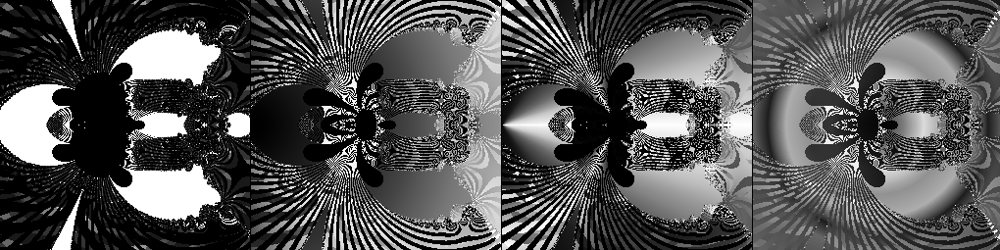

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpmw68qbtv


          bugga_bear: 50.075573 seconds
          parameters: [ -0.88384258   3.18437439 -86.37910797]

             ET                            Zd                            Zr                           All


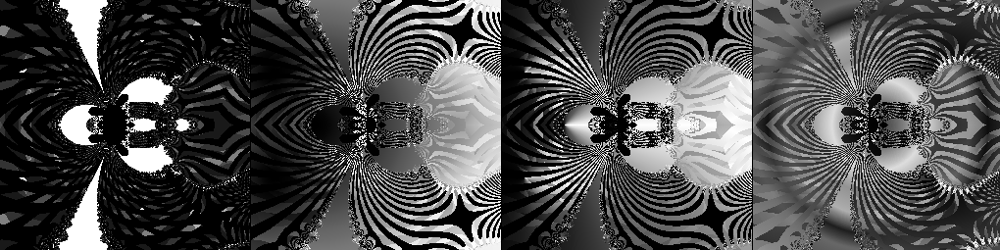

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmptesoo2f5


          bugga_bear: 7.008441 seconds
          parameters: [ -0.88384258   3.18437439 -86.37910797]

             ET                            Zd                            Zr                           All


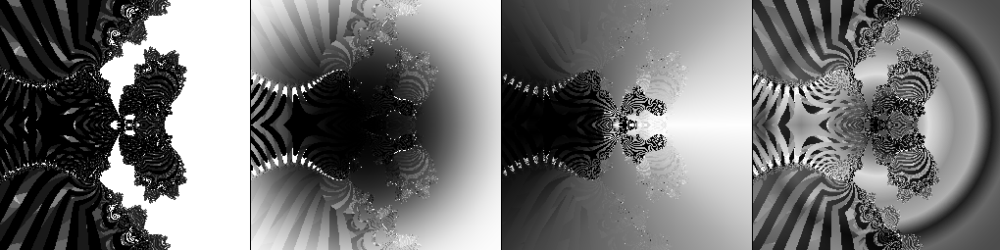

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp3_hp_uya


          bugga_bear: 14.399528 seconds
          parameters: [ -0.88384258   3.18437439 -86.37910797]

             ET                            Zd                            Zr                           All


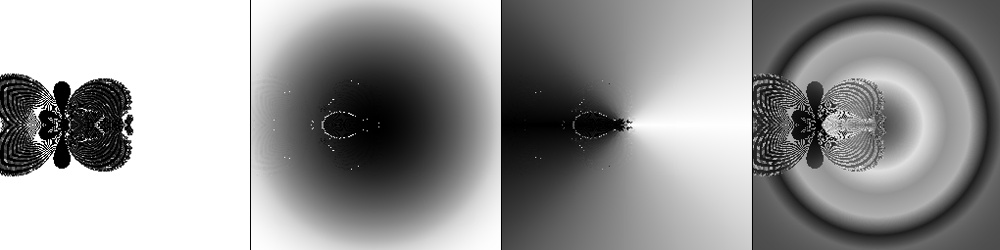



			parameter set 1 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp68xuzdzh


          bugga_bear: 5.236683 seconds
          parameters: [ -0.91793683   2.99268015 -84.94405062]

             ET                            Zd                            Zr                           All


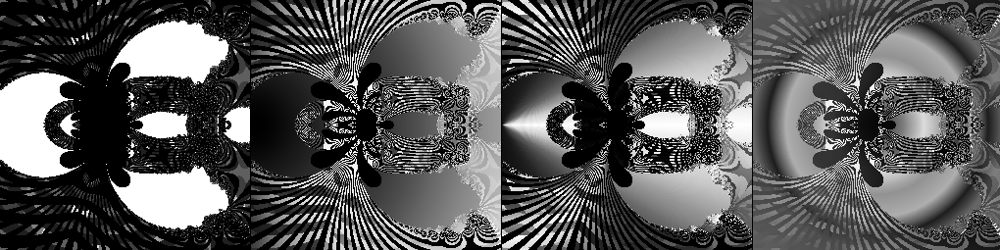

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpufao1g2i


          bugga_bear: 2.168762 seconds
          parameters: [ -0.91793683   2.99268015 -84.94405062]

             ET                            Zd                            Zr                           All


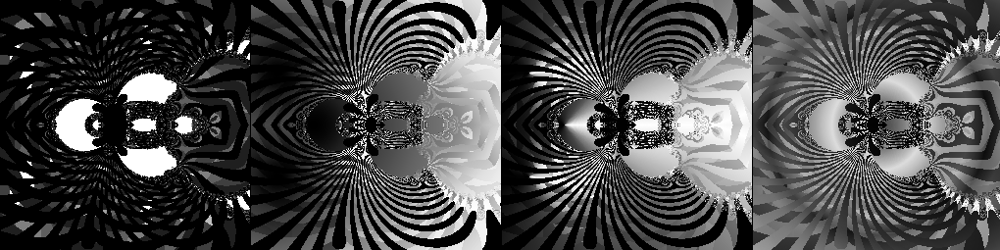

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpf5qozh0x


          bugga_bear: 1.344059 seconds
          parameters: [ -0.91793683   2.99268015 -84.94405062]

             ET                            Zd                            Zr                           All


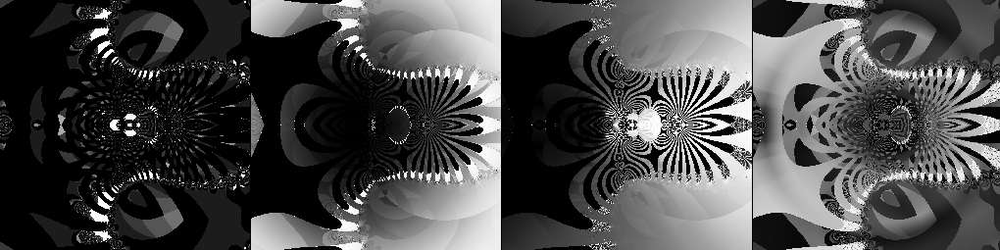

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmplp5mld14


          bugga_bear: 1.224506 seconds
          parameters: [ -0.91793683   2.99268015 -84.94405062]

             ET                            Zd                            Zr                           All


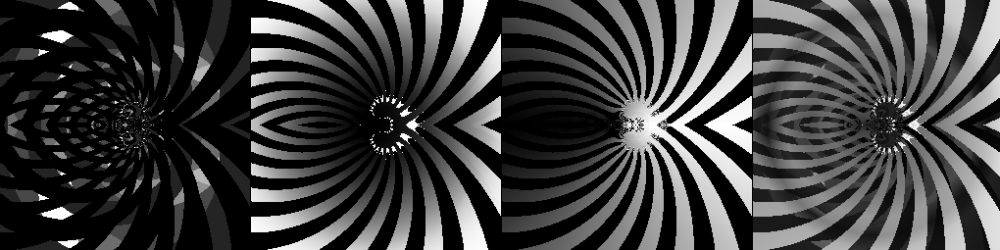



			parameter set 2 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpqat7zeix


          bugga_bear: 5.226459 seconds
          parameters: [ -0.83209242   3.00822521 -83.3533324 ]

             ET                            Zd                            Zr                           All


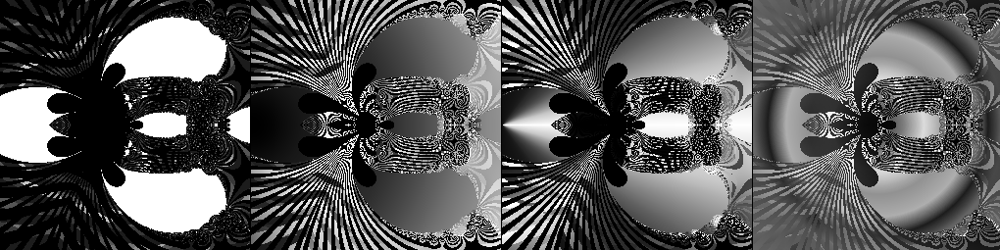

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpq2bopmb6


          bugga_bear: 2.197332 seconds
          parameters: [ -0.83209242   3.00822521 -83.3533324 ]

             ET                            Zd                            Zr                           All


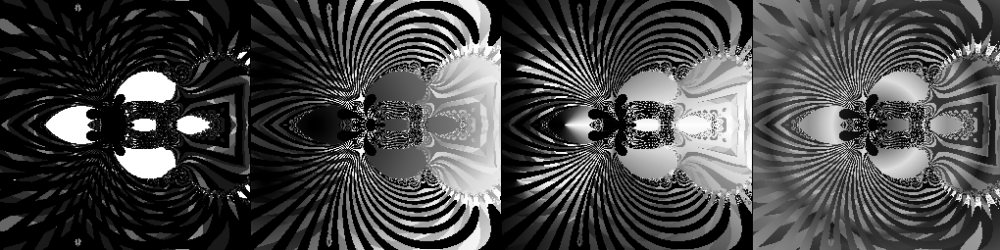

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp6c6re5ak


          bugga_bear: 1.677512 seconds
          parameters: [ -0.83209242   3.00822521 -83.3533324 ]

             ET                            Zd                            Zr                           All


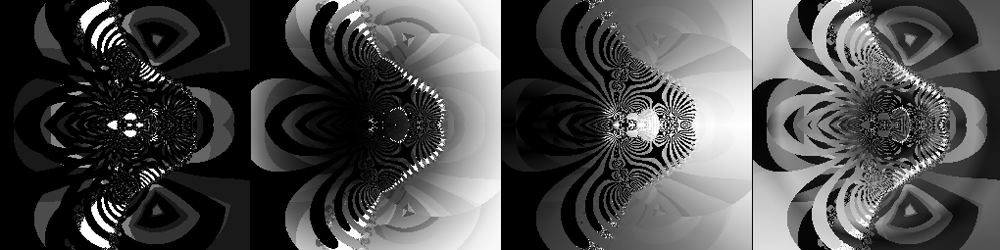

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp1h7fgaw_


          bugga_bear: 1.167076 seconds
          parameters: [ -0.83209242   3.00822521 -83.3533324 ]

             ET                            Zd                            Zr                           All


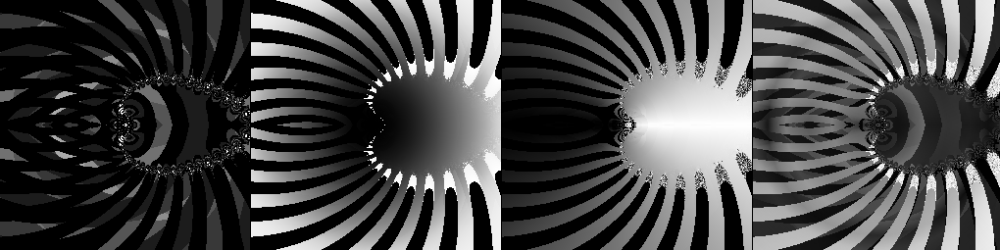



			parameter set 3 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpnfiazksl


          bugga_bear: 4.543700 seconds
          parameters: [ -0.87362064   3.0577648  -92.02334315]

             ET                            Zd                            Zr                           All


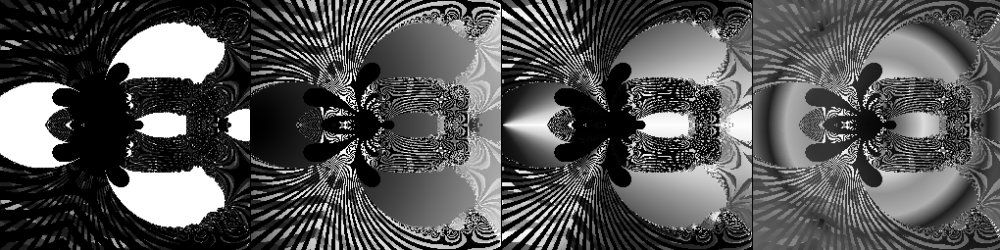

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpr6qakckx


          bugga_bear: 2.204712 seconds
          parameters: [ -0.87362064   3.0577648  -92.02334315]

             ET                            Zd                            Zr                           All


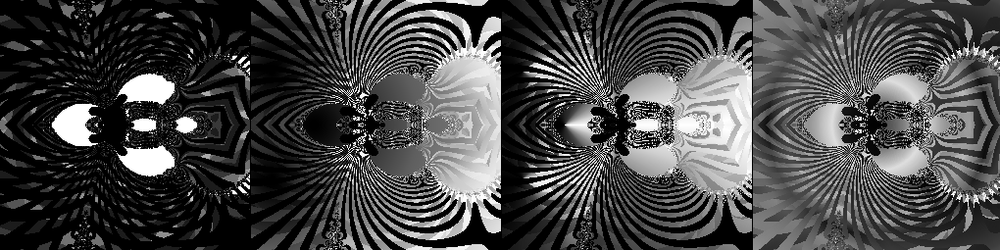

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpwotsemw3


          bugga_bear: 1.475812 seconds
          parameters: [ -0.87362064   3.0577648  -92.02334315]

             ET                            Zd                            Zr                           All


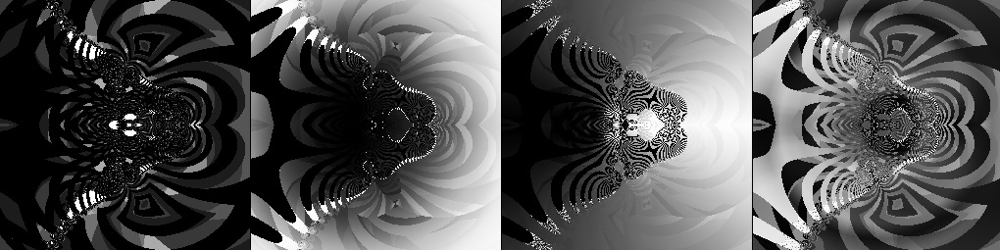

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpan1c4jmt


          bugga_bear: 1.167822 seconds
          parameters: [ -0.87362064   3.0577648  -92.02334315]

             ET                            Zd                            Zr                           All


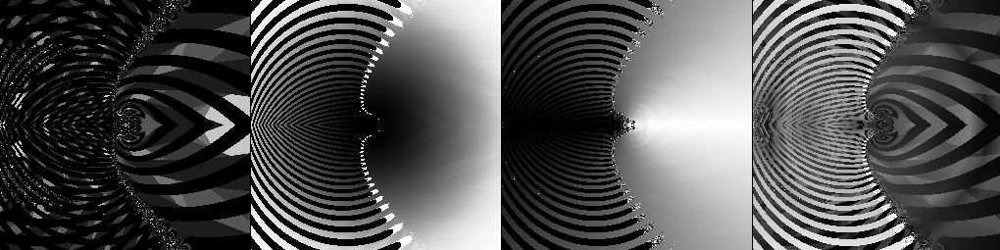



			parameter set 4 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpaeq8b3gi


          bugga_bear: 1.254913 seconds
          parameters: [ -0.86984609   3.3584302  -83.2368426 ]

             ET                            Zd                            Zr                           All


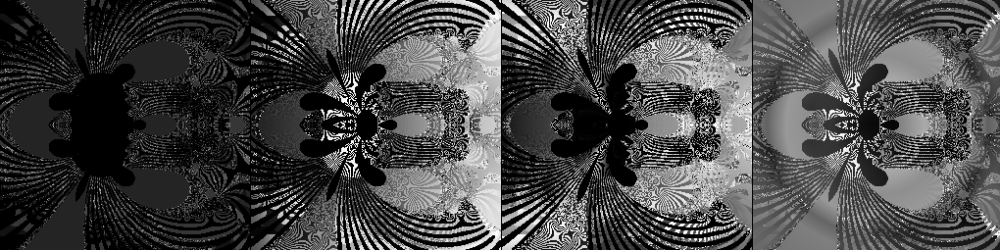

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp7padzhsl


          bugga_bear: 1.259499 seconds
          parameters: [ -0.86984609   3.3584302  -83.2368426 ]

             ET                            Zd                            Zr                           All


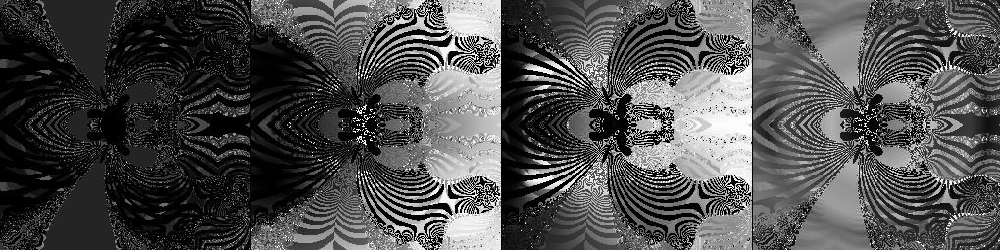

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpacbaobi9


          bugga_bear: 1.452045 seconds
          parameters: [ -0.86984609   3.3584302  -83.2368426 ]

             ET                            Zd                            Zr                           All


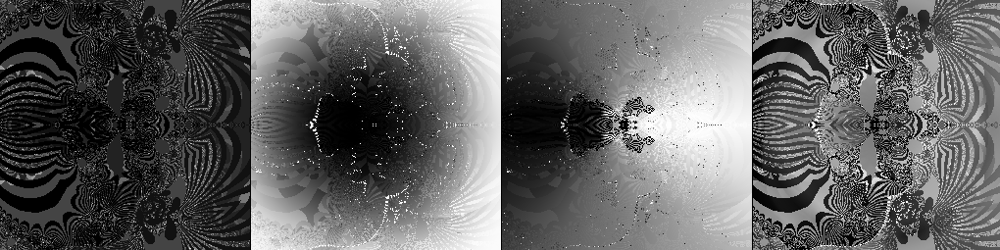

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmplh5f9dgb


          bugga_bear: 1.559710 seconds
          parameters: [ -0.86984609   3.3584302  -83.2368426 ]

             ET                            Zd                            Zr                           All


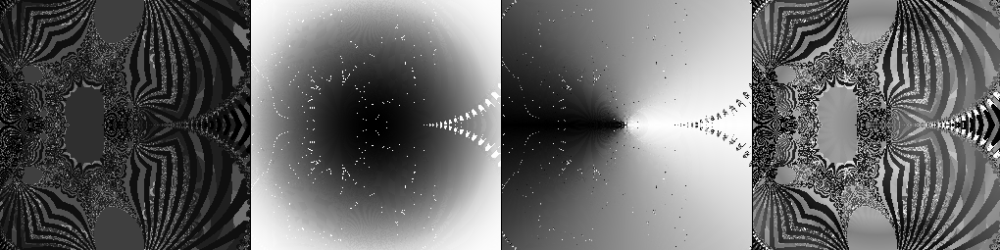



			parameter set 5 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpk_lmnhml


          bugga_bear: 4.250398 seconds
          parameters: [ -0.90160273   3.1183662  -90.23432738]

             ET                            Zd                            Zr                           All


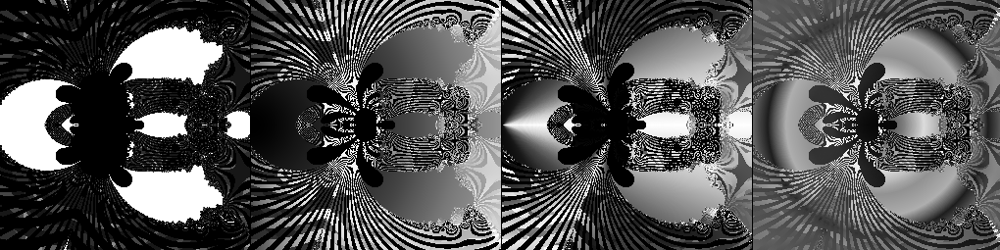

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp2x3e9mbf


          bugga_bear: 2.315698 seconds
          parameters: [ -0.90160273   3.1183662  -90.23432738]

             ET                            Zd                            Zr                           All


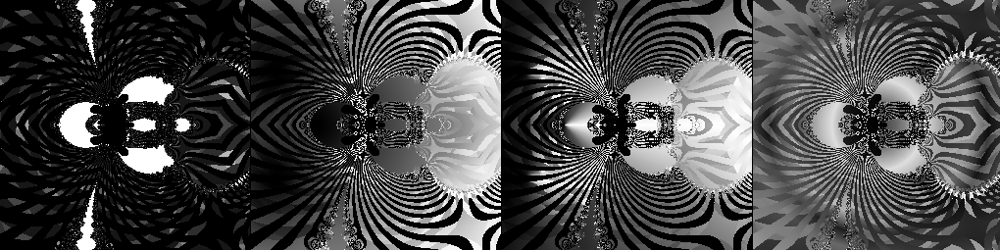

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp16fh9ssf


          bugga_bear: 2.208283 seconds
          parameters: [ -0.90160273   3.1183662  -90.23432738]

             ET                            Zd                            Zr                           All


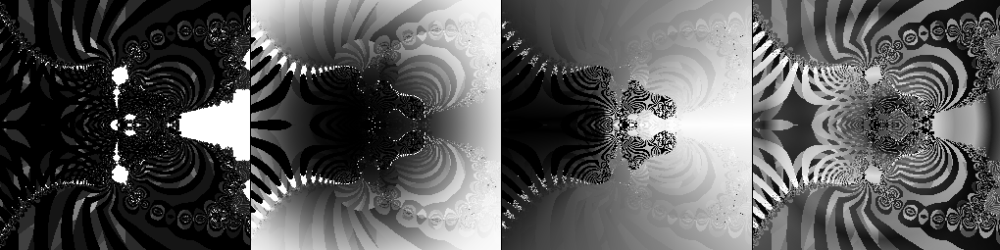

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp4vng09mz


          bugga_bear: 5.784409 seconds
          parameters: [ -0.90160273   3.1183662  -90.23432738]

             ET                            Zd                            Zr                           All


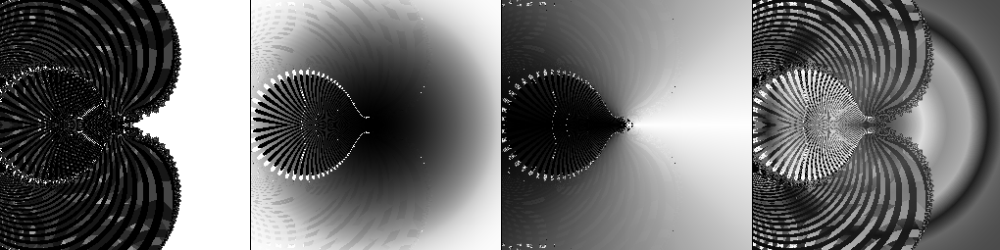



			parameter set 6 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp192h3xqd


          bugga_bear: 6.402382 seconds
          parameters: [ -0.81146264   3.31907644 -88.06370016]

             ET                            Zd                            Zr                           All


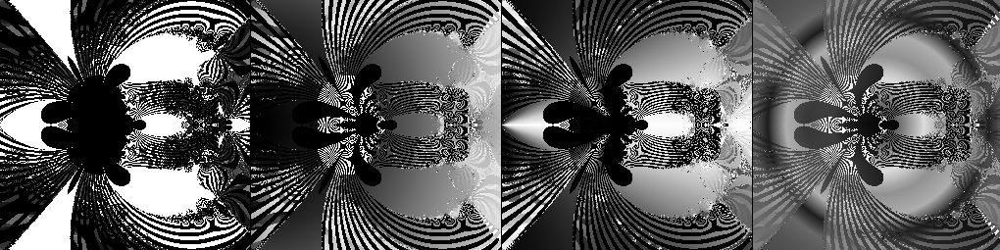

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpzxzfh598


          bugga_bear: 5.068289 seconds
          parameters: [ -0.81146264   3.31907644 -88.06370016]

             ET                            Zd                            Zr                           All


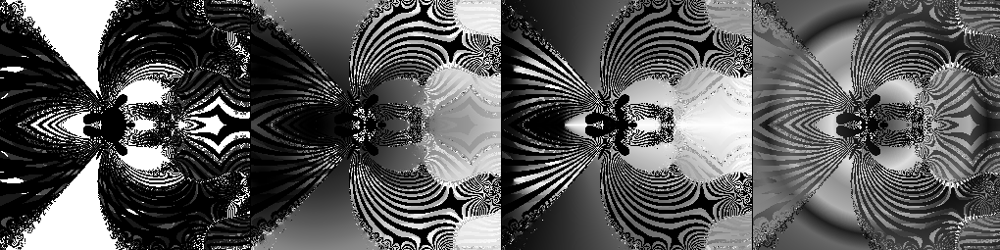

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmps15shnoz


          bugga_bear: 11.298342 seconds
          parameters: [ -0.81146264   3.31907644 -88.06370016]

             ET                            Zd                            Zr                           All


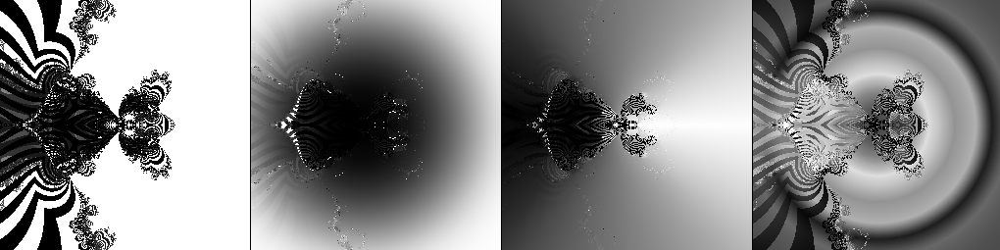

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp03hodxgn


          bugga_bear: 15.499496 seconds
          parameters: [ -0.81146264   3.31907644 -88.06370016]

             ET                            Zd                            Zr                           All


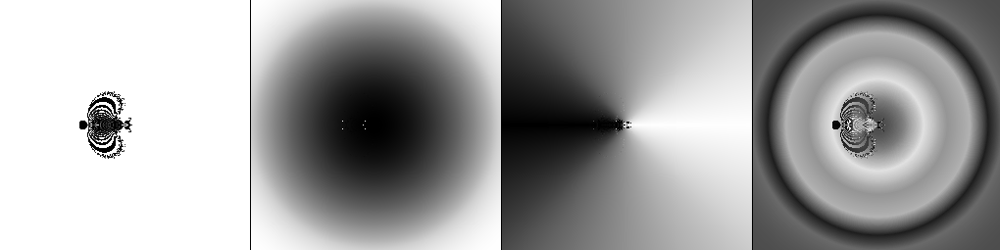



			parameter set 7 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpiyhyww18


          bugga_bear: 4.459374 seconds
          parameters: [ -0.8651611    3.16376185 -89.99856096]

             ET                            Zd                            Zr                           All


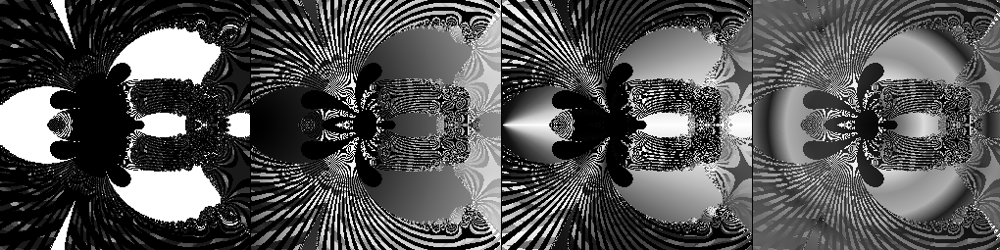

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpj70ros1k


          bugga_bear: 2.613831 seconds
          parameters: [ -0.8651611    3.16376185 -89.99856096]

             ET                            Zd                            Zr                           All


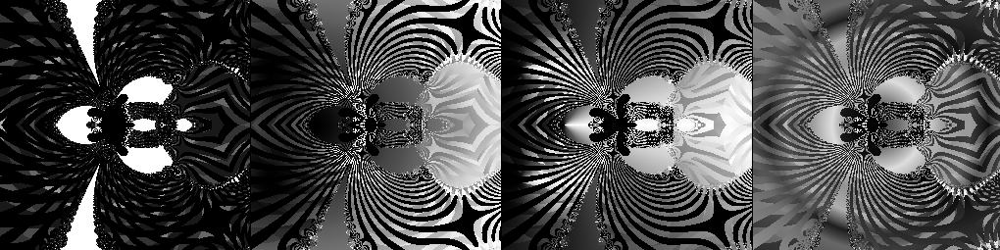

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmppt4g65d_


          bugga_bear: 6.401030 seconds
          parameters: [ -0.8651611    3.16376185 -89.99856096]

             ET                            Zd                            Zr                           All


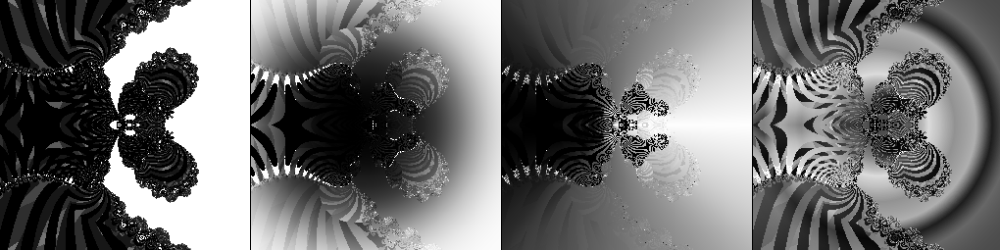

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpyv7give2


          bugga_bear: 10.890467 seconds
          parameters: [ -0.8651611    3.16376185 -89.99856096]

             ET                            Zd                            Zr                           All


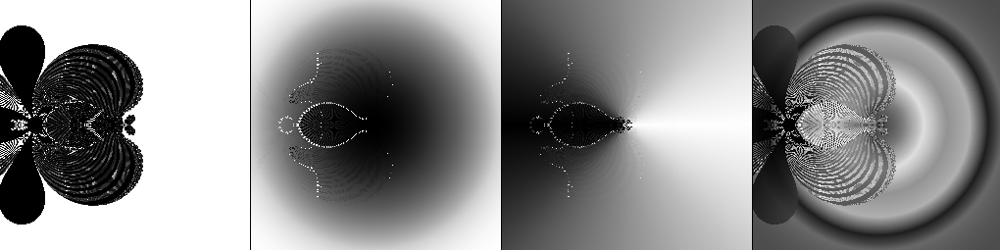



			parameter set 8 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp2flzrmhy


          bugga_bear: 4.370281 seconds
          parameters: [ -0.85080667   3.12718451 -77.69825202]

             ET                            Zd                            Zr                           All


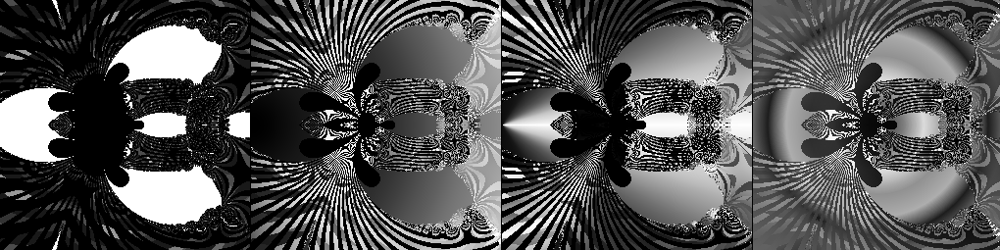

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmphlm7k0su


          bugga_bear: 2.310607 seconds
          parameters: [ -0.85080667   3.12718451 -77.69825202]

             ET                            Zd                            Zr                           All


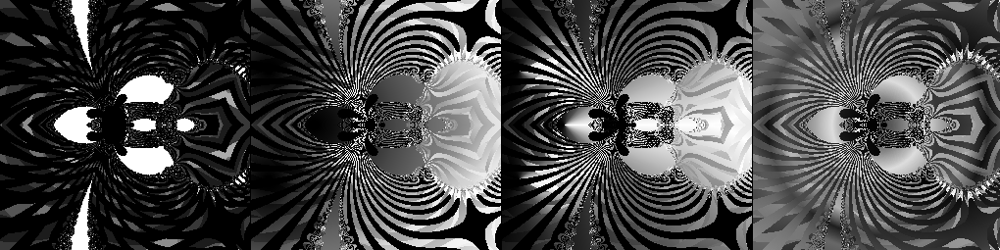

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpgq03s8xp


          bugga_bear: 2.291864 seconds
          parameters: [ -0.85080667   3.12718451 -77.69825202]

             ET                            Zd                            Zr                           All


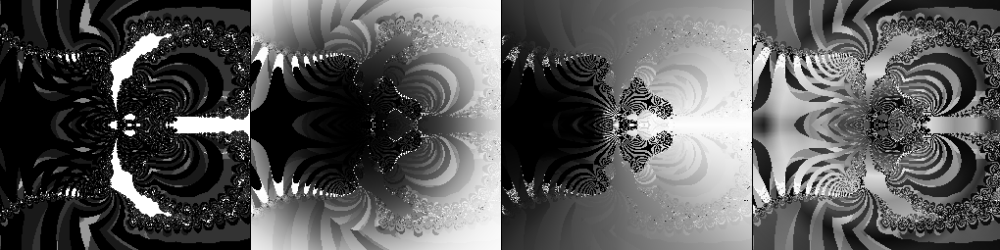

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp6gp4522l


          bugga_bear: 3.744970 seconds
          parameters: [ -0.85080667   3.12718451 -77.69825202]

             ET                            Zd                            Zr                           All


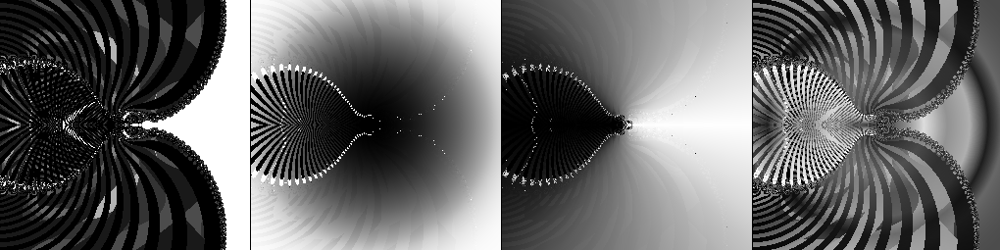



			parameter set 9 of 10

Zoom 4 times
		4 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpkke0fvn4


          bugga_bear: 5.404945 seconds
          parameters: [ -0.81926756   2.94726327 -88.39489666]

             ET                            Zd                            Zr                           All


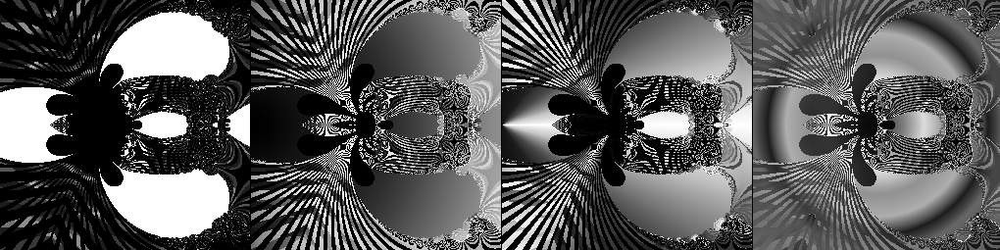

		3 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp18z9kfrb


          bugga_bear: 2.711808 seconds
          parameters: [ -0.81926756   2.94726327 -88.39489666]

             ET                            Zd                            Zr                           All


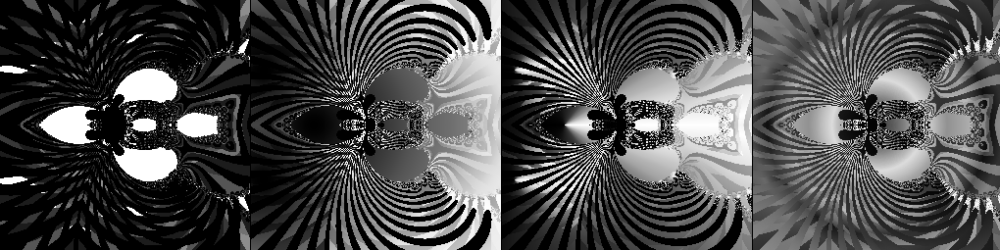

		2 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmptjn053vv


          bugga_bear: 2.793277 seconds
          parameters: [ -0.81926756   2.94726327 -88.39489666]

             ET                            Zd                            Zr                           All


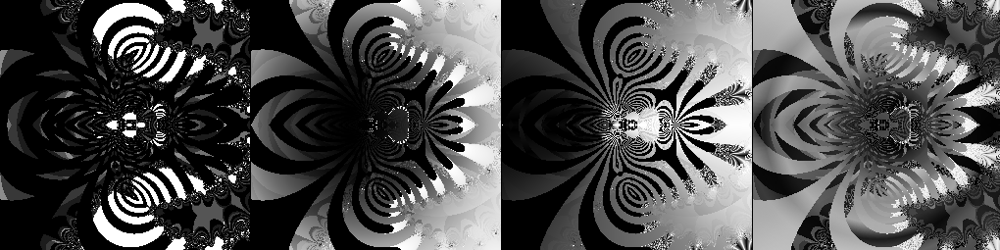

		1 to go
domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpwq63g29b


          bugga_bear: 1.477723 seconds
          parameters: [ -0.81926756   2.94726327 -88.39489666]

             ET                            Zd                            Zr                           All


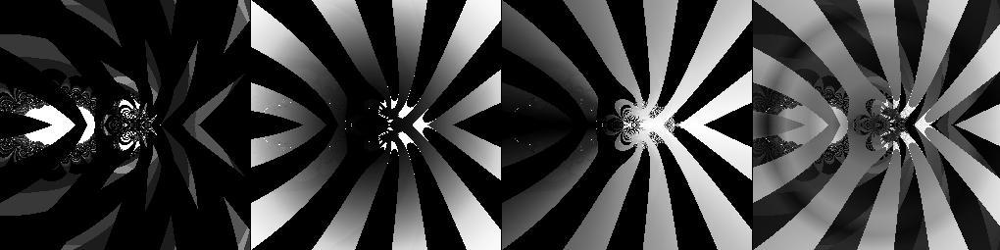

In [5]:
"""
                    bugga_bear exploration - parameters
"""
dither_f = 0.05
number_p_variations = 10

parameters = [-0.851612290000, 3.2197212063585856, -88.14578913619096]
# scale dist == multiplier of domain diagonal to get escape distance
scale_dist = 12

domain_dict = get_test_domain_dict()
fcn_number = 5

fcn_name, fcn = name_functionhandle_dict[fcn_number][0], name_functionhandle_dict[fcn_number][1]
display_source(fcn)
for k in range(number_p_variations):
    # p = p = fcn(0.0, None)
    p = dither_pars(parameters, dither_f)
    list_tuple = [(fcn, (p))]
    print('\n\n\t\t\tparameter set %i of %i\n'%(k, number_p_variations))
    zoom_fact_list = [1/((1+k)**k) for k in range(0, 4)]

    n_to_go = len(zoom_fact_list)
    print('Zoom %i times'%(n_to_go))

    for zoom_fact in zoom_fact_list:
        domain_dict['zoom'] = zoom_fact
        domain_dict['max_d'] = scale_dist / domain_dict['zoom']
        print('\t\t%i to go'%(n_to_go))
        n_to_go -= 1
        display_calc_result(list_tuple, domain_dict)

In [6]:
whole_page_run_time = time.time() - whole_page_start_time
print('discontinued whole page timer')
print('Total Time - Run all Cells, 30 variations = %im %0.3fs'%(whole_page_run_time//60, whole_page_run_time%60))

discontinued whole page timer
Total Time - Run all Cells, 30 variations = 20m 31.036s


In [ ]:
"""
            Nov 12, 2019 run all 15 available (chance-known eq parameters) - lukewarm frame
            Total Time - Run all Cells = 16m 6.295s
            
"""
print('')